# Итоговый проект "Анализ клиентской базы"

## 1 этап: "Выгрузка, предобработка и анализ базы данных"

Выгрузим исходный файл и подгрузим все библиотеки, которые могли бы понадобиться в проекте.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from scipy.stats import zscore
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

marketing_dataset = 'C:/Users/Виктория/Vika Folder 102023/worksWITHpandas/3_marketing_campaign.csv'
main_data = pd.read_csv (marketing_dataset)
main_data.index.name='Id'
main_data

,Unnamed: 0,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
Id,,,,,,,,,,,,,,,,,,,,,
0,0,5524,1957,Graduation,Single,58138.0 $,no,no,04-09-2012,58,...,7,0,0,0,0,0,0,3,11,1
1,1,2174,1954,Graduation,Single,46344.0 $,1,1,08-03-2014,38,...,5,0,0,0,0,0,0,3,11,0
2,2,4141,1965,Graduation,Together,71613.0 $,no,no,21-08-2013,26,...,4,0,0,0,0,0,0,3,11,0
3,3,6182,1984,Graduation,Together,26646.0 $,1,no,10-02-2014,26,...,6,0,0,0,0,0,0,3,11,0
4,4,5324,1981,Doctor of Philosophy,Married,58293.0 $,1,no,19-01-2014,94,...,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,2235,10870,1967,Graduation,Married,61223.0 $,no,1,13-06-2013,46,...,5,0,0,0,0,0,0,3,11,0
2236,2236,4001,1946,Doctor of Philosophy,Together,64014.0 $,2,1,10-06-2014,56,...,7,0,0,0,1,0,0,3,11,0
2237,2237,7270,1981,Graduation,Divorced,56981.0 $,no,no,25-01-2014,91,...,6,0,1,0,0,0,0,3,11,0


In [2]:
main_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 30 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Unnamed: 0           2240 non-null   int64 
 1   ID                   2240 non-null   int64 
 2   Year_Birth           2240 non-null   int64 
 3   Education            2240 non-null   object
 4   Marital_Status       2240 non-null   object
 5   Income               2240 non-null   object
 6   Kidhome              2240 non-null   object
 7   Teenhome             2240 non-null   object
 8   Dt_Customer          2240 non-null   object
 9   Recency              2240 non-null   int64 
 10  MntWines             2240 non-null   int64 
 11  MntFruits            2240 non-null   int64 
 12  MntMeatProducts      2240 non-null   int64 
 13  MntFishProducts      2240 non-null   int64 
 14  MntSweetProducts     2240 non-null   int64 
 15  MntGoldProds         2240 non-null   int64 
 16  NumDea

Проверка имеющихся значений по году рождения клиента для анализа выбросов

In [3]:
agg_functions = { 'Year_Birth': ['min' , 'max'] }                
main_data.agg (agg_functions)

,Year_Birth
min,1893
max,1996


In [4]:
main_data.sort_values(by='Year_Birth')

,Unnamed: 0,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
Id,,,,,,,,,,,,,,,,,,,,,
239,239,11004,1893,2n Cycle,Single,60182.0 $,no,1,17-05-2014,23,...,4,0,0,0,0,0,0,3,11,0
339,339,1150,1899,Doctor of Philosophy,Together,83532.0 $,no,no,26-09-2013,36,...,1,0,0,1,0,0,0,3,11,0
192,192,7829,1900,2n Cycle,Divorced,36640.0 $,1,no,26-09-2013,99,...,5,0,0,0,0,0,1,3,11,0
1950,1950,6663,1940,Doctor of Philosophy,Single,51141.0 $,no,no,08-07-2013,96,...,5,0,0,0,0,0,0,3,11,0
424,424,6932,1941,PhD,Married,93027.0 $,no,no,13-04-2013,77,...,2,0,0,1,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
747,747,10548,1995,Graduation,Single,71163.0 $,no,no,09-03-2014,30,...,1,0,0,0,0,0,0,3,11,0
1850,1850,4427,1995,2n Cycle,Single,83257.0 $,no,no,18-09-2012,56,...,6,1,0,1,0,0,1,3,11,1
696,696,8315,1995,Graduation,Single,34824.0 $,no,no,26-03-2014,65,...,6,0,0,0,0,0,0,3,11,0


Видим, что в выборке присутствуют клиенты с малореальным годом рождения, а именно, на момент исследования им должно было бы быть 110-120 лет. Поэтому удаляем из исследования данных клиентов, считая их выбросами.

In [5]:
main_data = main_data [ main_data ['Year_Birth'] >= 1940  ]

Проверка имеющихся значений по образованию клиента для анализа выбросов

In [6]:
main_data['Education'].value_counts()

Education
Graduation              1127
Master                   370
PhD                      280
Doctor of Philosophy     205
2n Cycle                 201
Basic                     54
Name: count, dtype: int64

Привидение к единообразию и преобразование столбца Education в цифровое значение для дальнейшего анализа  

In [7]:
main_data = main_data.copy()
main_data['Education'] = main_data['Education'].replace('Doctor of Philosophy', 'PhD')
main_data['EducationINT'] = main_data['Education']                   
main_data['EducationINT'] = main_data['EducationINT'].replace('Basic', 0)
main_data['EducationINT'] = main_data['EducationINT'].replace('Graduation', 1)
main_data['EducationINT'] = main_data['EducationINT'].replace('2n Cycle', 2)
main_data['EducationINT'] = main_data['EducationINT'].replace('Master', 2 )
main_data['EducationINT'] = main_data['EducationINT'].replace('PhD', 3 )   

Привидение к единообразию, анализ и удаление выбросом и преобразование столбца Marital_Status в цифровое значение для дальнейшего анализа

In [8]:
main_data['Marital_Status'].value_counts() 

Marital_Status
Married     864
Together    579
Single      479
Divorced    231
Widow        77
Alone         3
Absurd        2
YOLO          2
Name: count, dtype: int64

In [9]:
main_data = main_data.copy()
main_data['Marital_Status'] = main_data['Marital_Status'].replace('Alone', 'Single')
main_data['Marital_Status'] = main_data['Marital_Status'].replace('YOLO', 'Single')                     

In [10]:
main_data = main_data [ main_data['Marital_Status'] != 'Absurd']  

In [11]:
main_data['Marital_StatusINT'] = main_data['Marital_Status'] 
main_data[pd.get_dummies(main_data['Marital_Status']).columns]=pd.get_dummies(main_data['Marital_Status'])*1
main_data = main_data.drop('Marital_StatusINT', axis=1)
main_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2235 entries, 0 to 2239
Data columns (total 36 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Unnamed: 0           2235 non-null   int64 
 1   ID                   2235 non-null   int64 
 2   Year_Birth           2235 non-null   int64 
 3   Education            2235 non-null   object
 4   Marital_Status       2235 non-null   object
 5   Income               2235 non-null   object
 6   Kidhome              2235 non-null   object
 7   Teenhome             2235 non-null   object
 8   Dt_Customer          2235 non-null   object
 9   Recency              2235 non-null   int64 
 10  MntWines             2235 non-null   int64 
 11  MntFruits            2235 non-null   int64 
 12  MntMeatProducts      2235 non-null   int64 
 13  MntFishProducts      2235 non-null   int64 
 14  MntSweetProducts     2235 non-null   int64 
 15  MntGoldProds         2235 non-null   int64 
 16  NumDealsPur

Привидение к единообразию и преобразование столбца Kidhome в цифровое значение для дальнейшего анализа

In [12]:
main_data['Kidhome'].value_counts()

Kidhome
no    1289
1      898
2       48
Name: count, dtype: int64

In [13]:
main_data['Teenhome'].value_counts()

Teenhome
no    1154
1     1029
2       52
Name: count, dtype: int64

In [14]:
main_data = main_data.copy()
main_data['Kidhome'] = main_data['Kidhome'].replace('no', 0)
main_data['Kidhome'] = main_data['Kidhome'].apply(np.int64)
main_data['Teenhome'] = main_data['Teenhome'].replace('no', 0)
main_data['Teenhome'] = main_data['Teenhome'].apply(np.int64)

Проверка клиентов на максимальную давность заказа для выявления пассивных клиентов (в днях)

In [15]:
main_data['Recency'].max()           

99

Видим, что все клиенты активные, делающие покупки в настоящее время. Выбросов по данному параметру нет.

Далее сделаем проверку на имеющиеся значения по столбцам Complain, Response, Z_CostContact, Z_CostContact и оценим их.

In [16]:
main_data['Complain'].value_counts() 	

Complain
0    2215
1      20
Name: count, dtype: int64

In [17]:
main_data['Response'].value_counts() 

Response
0    1902
1     333
Name: count, dtype: int64

In [18]:
main_data['Z_CostContact'].value_counts() 

Z_CostContact
3    2235
Name: count, dtype: int64

In [19]:
main_data['Z_Revenue'].value_counts() 

Z_Revenue
11    2235
Name: count, dtype: int64


По полученным данным видим, что:
- в нашей выборке есть "жалобщики"(Complain), их довольно мало (20 клиентов), но они есть,
- примерно 15% клиентов отозвались и совершили покупки по персонализированной последней акции (Response),
- столбцы Z_CostContact и Z_Revenue имеют одно и то же значение, обезличивают клиентов, не давая им каких-либо персонализированных особенностей, и поэтому могут быть удалены.

In [20]:
# удаление незначащих столбцов 
main_data = main_data.drop(['Unnamed: 0', 'ID', 'Z_Revenue', 'Z_CostContact'], axis = 1)   

Далее сделаем преобразование значений в столбце Dt_Customer из строчного формата в формат даты и проверим на диапазоны значений для анализа выбросов

In [21]:
main_data['Dt_Customer'] = pd.to_datetime(main_data['Dt_Customer'], format = "%d-%m-%Y")

In [22]:
agg_functions = { 'Dt_Customer': ['min' , 'max', 'mean', 'median'] }                
main_data.agg (agg_functions)

,Dt_Customer
min,2012-07-30 00:00:00.000000000
max,2014-06-29 00:00:00.000000000
mean,2013-07-10 05:14:24.966443008
median,2013-07-08 00:00:00.000000000


Видим, что все данные адекватные, выбросов нет.
    
И далее займемся преобразованием и анализом значений в столбце Income.

In [23]:
def remuve_usd(stroka:str):
    stroka = str(stroka)
    if stroka.find("$")!=-1:
        stroka = stroka.replace("$", "")
        return float(stroka)

In [24]:
main_data['Income'] = main_data["Income"].apply(remuve_usd)

Проверим полученные значения для анализа данных и выявления выбросов. Проверку сделаем несколькими способами.

In [25]:
agg_functions = { 'Income': ['min' , 'max', 'mean', 'median'] }                
main_data.agg (agg_functions)

,Income
min,1730.000000
max,666666.000000
mean,52218.373587
median,51369.000000


In [26]:
main_data.sort_values(by='Income', ascending=False)

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,AcceptedCmp1,AcceptedCmp2,Complain,Response,EducationINT,Divorced,Married,Single,Together,Widow
Id,,,,,,,,,,,,,,,,,,,,,
2233,1977,Graduation,Together,666666.0,1,0,2013-06-02,23,9,14,...,0,0,0,0,1,0,0,0,1,0
617,1976,PhD,Together,162397.0,1,1,2013-06-03,31,85,1,...,0,0,0,0,3,0,0,0,1,0
687,1982,PhD,Married,160803.0,0,0,2012-08-04,21,55,16,...,0,0,0,0,3,0,1,0,0,0
1300,1971,Master,Together,157733.0,1,0,2013-06-04,37,39,1,...,0,0,0,0,2,0,0,0,1,0
164,1973,PhD,Married,157243.0,0,1,2014-03-01,98,20,2,...,0,0,0,0,3,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2078,1971,Graduation,Married,NaN,1,1,2013-03-03,82,71,1,...,0,0,0,0,1,0,1,0,0,0
2079,1954,Master,Together,NaN,0,1,2013-06-23,83,161,0,...,0,0,0,0,2,0,0,0,1,0
2081,1955,Graduation,Single,NaN,0,1,2013-10-18,95,264,0,...,0,0,0,0,1,0,0,1,0,0


Проверка показала необходимость удаления NaN-значений и явного выброса (доход семьи 666666.0). Сделаем данные преобразования.

In [27]:
main_data = main_data [ main_data ['Income'] < 600000]
main_data = main_data.dropna()
main_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2210 entries, 0 to 2239
Data columns (total 32 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Year_Birth           2210 non-null   int64         
 1   Education            2210 non-null   object        
 2   Marital_Status       2210 non-null   object        
 3   Income               2210 non-null   float64       
 4   Kidhome              2210 non-null   int64         
 5   Teenhome             2210 non-null   int64         
 6   Dt_Customer          2210 non-null   datetime64[ns]
 7   Recency              2210 non-null   int64         
 8   MntWines             2210 non-null   int64         
 9   MntFruits            2210 non-null   int64         
 10  MntMeatProducts      2210 non-null   int64         
 11  MntFishProducts      2210 non-null   int64         
 12  MntSweetProducts     2210 non-null   int64         
 13  MntGoldProds         2210 non-null   i

Проверим оставшиеся значения по столбцу Income на их корректность и вариабельность с помощью графиков - "Усатого ящика" и "Гистрограммы"

Income    Axes(0.125,0.11;0.775x0.77)
dtype: object

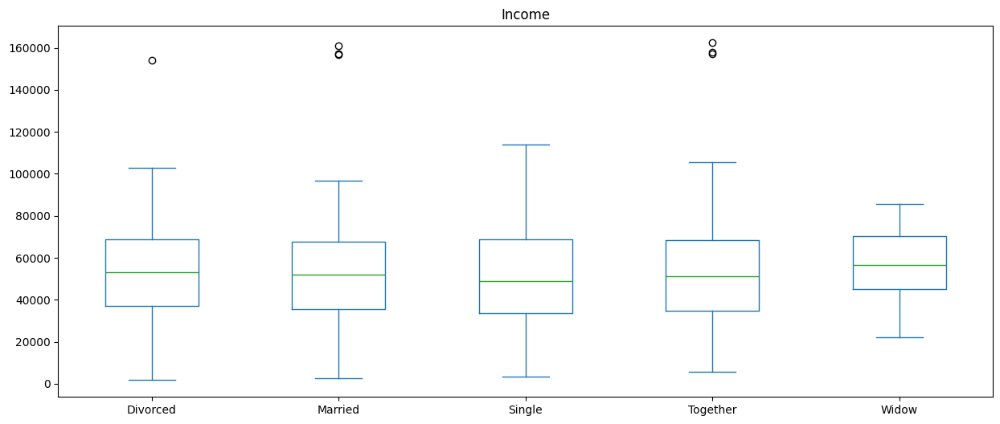

In [28]:
main_data.plot.box(column='Income', by='Marital_Status', figsize=(15, 6))

Text(0.5, 1.0, 'Распределение годового семейного дохода клиента')

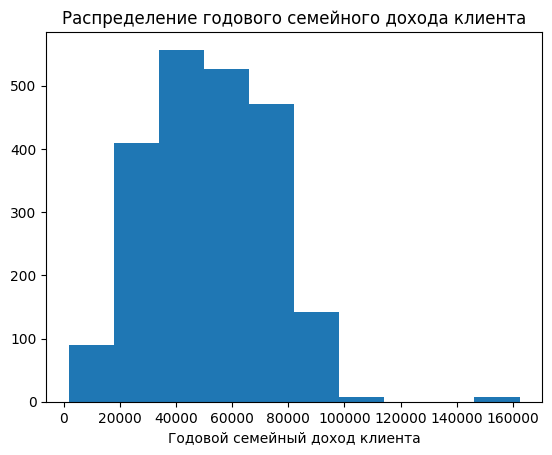

In [29]:
plt.hist(main_data['Income'], bins=10)
plt.xlabel('Годовой семейный доход клиента')
plt.title('Распределение годового семейного дохода клиента')

Будем считать, что доход более 140тыс не является выбросом, поскольку остальные характеристики клиентов с такими доходами дают основание считать эти  данные достоверными (высокий уровень образования, количество покупок, суммы расходов на продукты). В случае появления на следующих этапах проверки подозрений о некорректности данных, они будут удалены.

### Таким образом, в результате произведенной проверки на 1 этапе мы удалили выбросы, связанные с:
 - некорректным годом рождения клиента (3 выброса)
 - некорректно заполненной графой по семейному положению (2 выброса)
 - некорректным завышенным доходом (1 выброс)
 - строками с NaN (24 выброса).
Итого ушло из анализа из-за некорректности или отсутствия данных 30 строк при общей изначальной выборке 2240.




# 2 этап: "Наполнение датафэйма расчетными данными, необходимыми для дальнейшего анализа, и дополнительная проверка данных"

### Для более детального анализа клиентов введем дополнительные столбцы: 
- KidTeenSUMM - общее количество детей разных возрастов в семье,
- TotalSUMM - суммарный доход, который принес клиент компании, покупая разные категории товаров (выручка по клиенту),
- NumPurchasesSUMM - суммарного количества покупок, которое совершил клиент, приобретая товары разными каналами продаж, 
- %DealsPurchases - доля количества акционных покупок в общем количестве покупок
- AverageBill - средний чек
- AcceptedCmpSUMM - суммарная реакция клиента на рекламные кампании.

In [30]:
main_data['KidTeenSUMM'] = main_data['Kidhome'] + main_data['Teenhome']     
main_data['KidTeenSUMM'].value_counts() 

KidTeenSUMM
1    1114
0     630
2     416
3      50
Name: count, dtype: int64

In [31]:
main_data['TotalSUMM'] = main_data['MntWines'] + main_data['MntFruits'] + main_data['MntMeatProducts'] + main_data['MntFishProducts'] + main_data['MntSweetProducts'] + main_data['MntGoldProds']
# проверка полученных значений для анализа выбросов
agg_functions = { 'TotalSUMM': ['min' , 'max', 'mean', 'median'] }                
main_data.agg (agg_functions)

,TotalSUMM
min,5.000000
max,2525.000000
mean,606.738462
median,396.500000


Text(0.5, 1.0, 'Распределение суммарного дохода, принесенного клиентом при покупке всех категорий товаров')

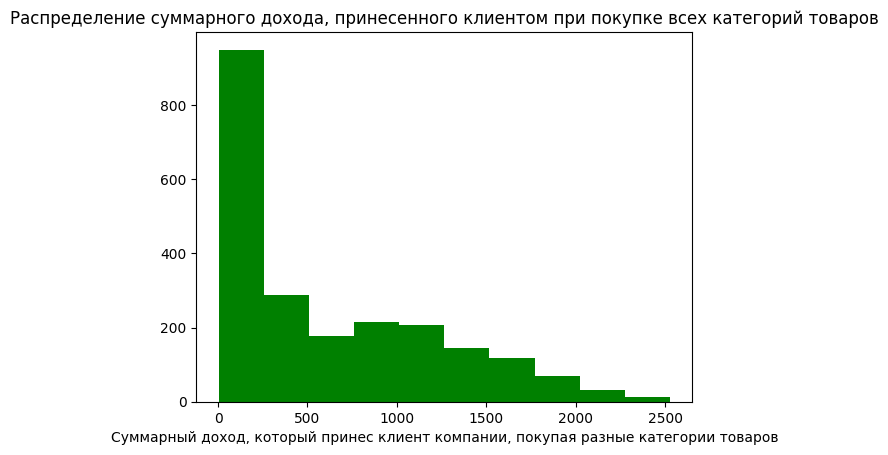

In [32]:
plt.hist(main_data['TotalSUMM'], bins=10, color='green')
plt.xlabel('Суммарный доход, который принес клиент компании, покупая разные категории товаров')
plt.title('Распределение суммарного дохода, принесенного клиентом при покупке всех категорий товаров')

In [33]:
main_data['NumPurchasesSUMM'] = main_data['NumWebPurchases'] + main_data['NumCatalogPurchases'] + main_data['NumStorePurchases']
# проверка полученных значений для анализа выбросов
agg_functions = { 'NumPurchasesSUMM': ['min' , 'max', 'mean', 'median'] }                        
main_data.agg (agg_functions)

,NumPurchasesSUMM
min,0.000000
max,32.000000
mean,12.562443
median,12.000000


Text(0.5, 1.0, 'Распределение суммарного количества покупок, совершенных клиентом при приобретении всех категорий товаров')

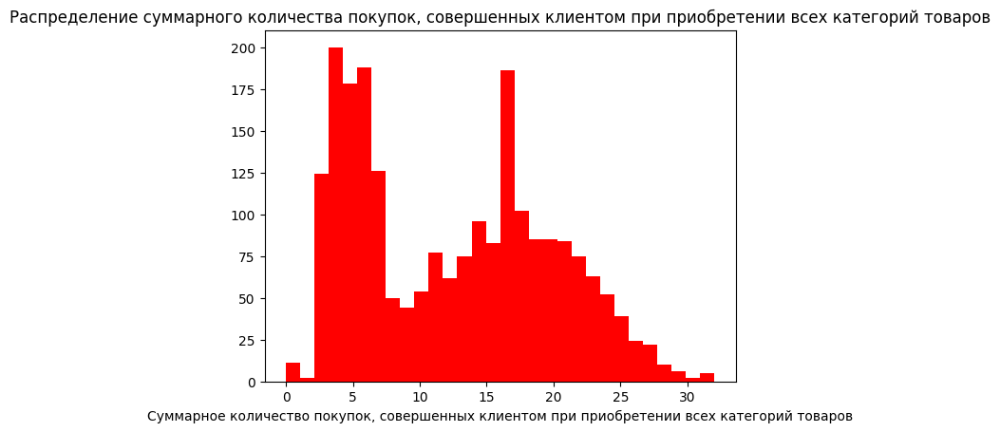

In [34]:
plt.hist(main_data['NumPurchasesSUMM'], bins=30, color='red')
plt.xlabel('Суммарное количество покупок, совершенных клиентом при приобретении всех категорий товаров')
plt.title('Распределение суммарного количества покупок, совершенных клиентом при приобретении всех категорий товаров')

### При расчете показателя TotalSUMM мы видели, что все клиенты принесли выручку компании, но тем не менее по показателю NumPurchasesSUMM видим, что есть клиенты, которые не делали покупок ни одним из доступных способов продаж (ни через WEB, ни через каталог, ни через сам магазин). 
Тогда проверим на корректность такие нулевые продажи и определим, исключать ли из анализа данных клиентов. 
Так же сопоставим количество покупок, сделанных по акции (NumDealsPurchases) с общим количеством сделанных покупок (NumPurchasesSUMM) - оно не может быть больше. 

In [35]:
nulevye_prodazhi = main_data [ (main_data ['NumPurchasesSUMM'] == 0 ) ] 
nulevye_prodazhi                   

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,Response,EducationINT,Divorced,Married,Single,Together,Widow,KidTeenSUMM,TotalSUMM,NumPurchasesSUMM
Id,,,,,,,,,,,,,,,,,,,,,
655,1975,Graduation,Divorced,153924.0,0,0,2014-02-07,81,1,1,...,0,1,1,0,0,0,0,0,6,0
981,1965,Graduation,Divorced,4861.0,0,0,2014-06-22,20,2,1,...,0,1,1,0,0,0,0,0,6,0
1245,1971,Graduation,Divorced,1730.0,0,0,2014-05-18,65,1,1,...,0,1,1,0,0,0,0,0,8,0
1524,1973,Graduation,Single,3502.0,1,0,2013-04-13,56,2,1,...,0,1,0,0,1,0,0,1,5,0
1846,1963,PhD,Married,4023.0,1,1,2014-06-23,29,5,0,...,0,3,0,1,0,0,0,2,9,0
2132,1949,PhD,Married,156924.0,0,0,2013-08-29,85,2,1,...,0,3,0,1,0,0,0,0,8,0


In [36]:
proverka = main_data [main_data ['NumPurchasesSUMM'] < main_data ['NumDealsPurchases']] 
proverka                                         

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,Response,EducationINT,Divorced,Married,Single,Together,Widow,KidTeenSUMM,TotalSUMM,NumPurchasesSUMM
Id,,,,,,,,,,,,,,,,,,,,,
1042,1991,Graduation,Single,8028.0,0,0,2012-09-18,62,73,18,...,0,1,0,0,1,0,0,0,178,1
1245,1971,Graduation,Divorced,1730.0,0,0,2014-05-18,65,1,1,...,0,1,1,0,0,0,0,0,8,0
1846,1963,PhD,Married,4023.0,1,1,2014-06-23,29,5,0,...,0,3,0,1,0,0,0,2,9,0


In [37]:
# Удаление выявленных выбросов 
main_data = main_data [ main_data ['NumPurchasesSUMM'] != 0  ]
main_data = main_data [ main_data ['NumPurchasesSUMM'] >= main_data ['NumDealsPurchases']  ]

In [38]:
# доля количества акционных покупок в общем количестве покупок
main_data['%DealsPurchases'] = main_data['NumDealsPurchases'] / main_data['NumPurchasesSUMM'] 
agg_functions = { '%DealsPurchases': ['min' , 'max', 'mean', 'median'] }
main_data.agg (agg_functions)

,%DealsPurchases
min,0.000000
max,1.000000
mean,0.241032
median,0.200000


Text(0.5, 1.0, 'Распределение доли количества акционных покупок в общем количестве покупок')

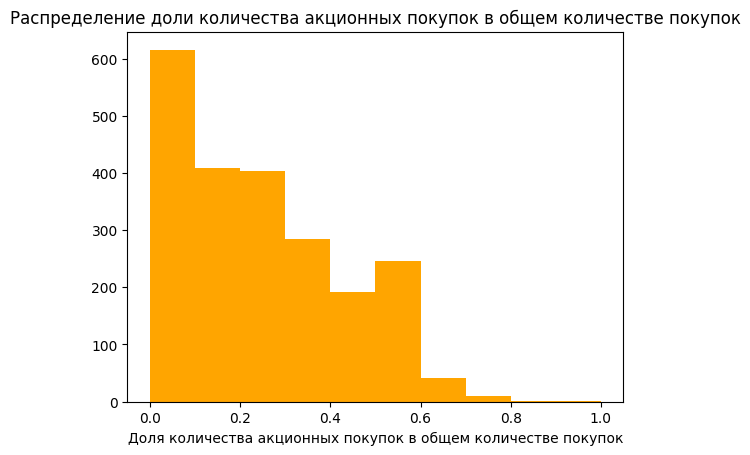

In [39]:
plt.hist(main_data['%DealsPurchases'], bins=10, color='orange')
plt.xlabel('Доля количества акционных покупок в общем количестве покупок')
plt.title('Распределение доли количества акционных покупок в общем количестве покупок')

По полученным данным видим, что есть клиенты, которые вообще не совершают покупок по акциям, есть те, кто только такие покупки и совершает, но в среднем только 20-25% клиентов пользуются спецпредложениями и акциями магазина.

In [40]:
# расчет и проверка среднего чека
main_data['AverageBill'] = main_data['TotalSUMM'] / main_data['NumPurchasesSUMM'] 
agg_functions = { 'AverageBill': ['min' , 'max', 'mean', 'median'] }
main_data.agg (agg_functions)

,AverageBill
min,2.666667
max,187.666667
mean,37.457222
median,29.857143


Text(0.5, 1.0, 'Распределение величины среднего чека')

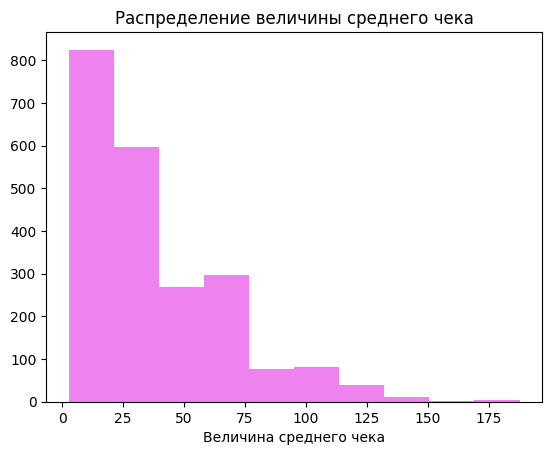

In [41]:
plt.hist(main_data['AverageBill'], bins=10, color='violet')
plt.xlabel('Величина среднего чека')
plt.title('Распределение величины среднего чека')

По полученным данным видим, что есть клиенты с очень маленьким, стремящимся к нулю, средним чеком. Проверим эти данные и поймем, что они не выбросы, а особенность покупательского поведения клиентов с небольшой суммой дохода.

In [42]:
# расчет и проверка мелкого среднего чека
small_bill = main_data [ main_data ['AverageBill'] < 3 ]
small_bill    

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,Divorced,Married,Single,Together,Widow,KidTeenSUMM,TotalSUMM,NumPurchasesSUMM,%DealsPurchases,AverageBill
Id,,,,,,,,,,,,,,,,,,,,,
1420,1972,PhD,Together,34578.0,2,1,2014-04-11,1,7,0,...,0,0,0,1,0,3,8,3,0.333333,2.666667
2129,1974,Graduation,Together,33590.0,2,1,2013-11-03,65,4,0,...,0,0,0,1,0,3,8,3,0.333333,2.666667


### Далее оценим, насколько подвержены клиенты проводимым рекламным кампаниям, персональным рассылкам и на сколько часто они посещают сайт.

In [43]:
# нахождение суммарной реакции клиента на рекламные кампании 
main_data['AcceptedCmpSUMM'] = main_data['AcceptedCmp1'] + main_data['AcceptedCmp2'] + main_data['AcceptedCmp3'] + main_data['AcceptedCmp4'] + main_data['AcceptedCmp5']   #+ main_data['Response']   
main_data['AcceptedCmpSUMM'].value_counts()  

AcceptedCmpSUMM
0    1746
1     322
2      80
3      44
4      11
Name: count, dtype: int64

In [44]:
# выявление клиентов, нереагирующих на рекламные акции, но ответивших на персональную точечную рекламу
target_resault = main_data [ (main_data ['AcceptedCmpSUMM'] == 0 ) & (main_data['Response'] > 0) ]
target_resault

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,Married,Single,Together,Widow,KidTeenSUMM,TotalSUMM,NumPurchasesSUMM,%DealsPurchases,AverageBill,AcceptedCmpSUMM
Id,,,,,,,,,,,,,,,,,,,,,
0,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,...,0,1,0,0,0,1617,22,0.136364,73.500000,0
8,1974,PhD,Together,30351.0,1,0,2013-06-06,19,14,0,...,0,0,1,0,1,46,5,0.200000,9.200000,0
33,1952,PhD,Divorced,46610.0,0,2,2012-10-29,8,96,12,...,0,0,0,0,2,302,11,0.545455,27.454545,0
46,1996,2n Cycle,Married,7500.0,0,0,2012-11-09,24,3,18,...,1,0,0,0,0,122,7,0.428571,17.428571,0
56,1966,Graduation,Divorced,70287.0,0,0,2013-04-02,30,295,35,...,0,0,0,0,0,1093,20,0.050000,54.650000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2139,1966,Master,Divorced,29435.0,1,1,2012-08-06,11,70,3,...,0,0,0,0,2,180,7,0.571429,25.714286,0
2160,1964,PhD,Married,60896.0,0,1,2012-10-11,90,1013,30,...,1,0,0,0,1,1701,23,0.130435,73.956522,0
2190,1983,Master,Single,89616.0,0,0,2013-02-25,36,671,47,...,0,1,0,0,0,1644,24,0.041667,68.500000,0


In [45]:
# проверка этих клиентов на их посещение сайта
target_resault ['NumWebVisitsMonth'].value_counts().reset_index().sort_values(by='NumWebVisitsMonth')  

,NumWebVisitsMonth,count
5,1,11
7,2,8
6,3,10
8,4,6
4,5,12
2,6,21
1,7,22
0,8,35
3,9,20
9,10,1


In [46]:
main_data['NumWebVisitsMonth'].value_counts().reset_index().sort_values(by='NumWebVisitsMonth')
#проверка всех клиентов на их посещение сайта - 356 клиентов (16%) посещали сайт менее 3раз

,NumWebVisitsMonth,count
9,0,8
7,1,148
6,2,200
5,3,203
4,4,216
3,5,278
2,6,334
0,7,387
1,8,340
8,9,82


In [47]:
web_resault = main_data [ (main_data['NumWebVisitsMonth'] != 0 ) & (main_data['NumWebPurchases'] == 0)]
web_resault                              # проверка результативности посещение сайта - у 39 клиентов посещение не привело к покупкам через него

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,Married,Single,Together,Widow,KidTeenSUMM,TotalSUMM,NumPurchasesSUMM,%DealsPurchases,AverageBill,AcceptedCmpSUMM
Id,,,,,,,,,,,,,,,,,,,,,
21,1979,Graduation,Married,2447.0,1,0,2013-01-06,42,1,1,...,1,0,0,0,1,1730,28,0.535714,61.785714,0
42,1957,Graduation,Together,21994.0,0,1,2012-12-24,4,9,0,...,0,0,1,0,1,22,3,0.333333,7.333333,0
78,1976,2n Cycle,Together,26326.0,0,0,2013-09-04,12,1,0,...,0,0,1,0,0,18,3,0.333333,6.000000,0
157,1978,Graduation,Single,60199.0,1,2,2013-09-12,49,8,1,...,0,1,0,0,3,18,3,0.333333,6.000000,0
178,1959,Graduation,Together,38285.0,2,1,2014-06-24,96,2,0,...,0,0,1,0,3,10,3,0.333333,3.333333,0
205,1984,Master,Single,18890.0,0,0,2012-11-10,5,6,4,...,0,1,0,0,0,35,3,0.333333,11.666667,1
294,1965,Graduation,Together,29672.0,1,1,2013-03-12,6,9,1,...,0,0,1,0,2,25,3,0.333333,8.333333,0
381,1985,Graduation,Married,19986.0,1,0,2013-11-14,74,3,6,...,1,0,0,0,1,22,3,0.333333,7.333333,0
384,1981,Master,Single,36143.0,1,0,2014-03-30,33,12,0,...,0,1,0,0,1,19,3,0.333333,6.333333,0


### В итоге после анализа маркетинговой составляющей видим, что:
- 79% клиентов не приняли участие\не воспользовались предложением ни одной из 5 проведенных рекламных кампании,
- однако, 146 клиентов из числа те, кто не интересовался общими акциями, среагировали на точечную целевую (персональную) кампанию\рассылку и участвовали в ней,
- все эти 146 клиентов являются пользователями и посетителями сайта магазина,
- в целом только 8 клиентов не посещало сайт магазина за последний месяц (всего 356 клиентов посещало сайт 0-2 раза за последний месяц),
- 39 клиентов посещали сайт, но не делали через него покупки.

### Таким образом, после 2 этапа исследования при вводе дополнительных столбцов и повторной проверке в выбросы ушло еще 7 клиентов. Итого для исследования осталось 2203 клиента - 98,35% от первоначального количества (2240). Так же мы увидели, какое поведение и отношение к акциям и интернет-сайту у клиентов данной компании. Эту информацию в дальнейшем, после разбиения на кластеры, попробуем отследить.






# 3 этап: "Анализ зависимостей данных и определение набора столбцов для дальнейшей кластеризации"

Поскольку проверка корреляций для анализа данных является важной составляющей, то на этом этапе работы проведем анализ зависимостей данных на основе двух видов графиков (матриц корреляции):
- путем построения парной диаграммы Pairplot для сравнения распределения пар числовых переменных, отобранных для сравнения характеристик,
- путем построения тепловой диаграммы Нeatmap для сравнения величины зависимости пар числовых переменных, отобранных для сравнения характеристик.

Для начала часть столбцов, которые не представляют интерес для анализа (в основном это дублирующие столбцы), удалим из текущего DateFrame.

In [48]:
#Удаляем незначащие столбцы
main_data1 = main_data.drop(['Dt_Customer','Education', 'Marital_Status', 'AcceptedCmp3', 'AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp4', 'AcceptedCmp5', 'Recency', 'Complain'], axis = 1)

In [49]:
#Возвращаем матрицу зависимости для обновленной таблицы
main_data1.corr()

,Year_Birth,Income,Kidhome,Teenhome,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,Married,Single,Together,Widow,KidTeenSUMM,TotalSUMM,NumPurchasesSUMM,%DealsPurchases,AverageBill,AcceptedCmpSUMM
Year_Birth,1.000000,-0.200666,0.239214,-0.362570,-0.165857,-0.015073,-0.033012,-0.043068,-0.022787,-0.062744,...,0.047280,0.125346,-0.053379,-0.164016,-0.091989,-0.117026,-0.177805,0.076665,-0.102264,-0.004352
Income,-0.200666,1.000000,-0.519988,0.037295,0.700079,0.515288,0.704315,0.528351,0.532360,0.393631,...,-0.011134,-0.020798,0.004573,0.040350,-0.345961,0.806371,0.757272,-0.640961,0.748987,0.371185
Kidhome,0.239214,-0.519988,1.000000,-0.041619,-0.499265,-0.373776,-0.440376,-0.389461,-0.379176,-0.355963,...,0.016642,0.015767,0.008270,-0.072408,0.687214,-0.559974,-0.578015,0.664812,-0.520150,-0.211684
Teenhome,-0.362570,0.037295,-0.041619,1.000000,0.002253,-0.176428,-0.262830,-0.205406,-0.164717,-0.017854,...,0.005299,-0.097577,0.025167,0.047665,0.697225,-0.139650,0.035425,0.275155,-0.147123,-0.129993
MntWines,-0.165857,0.700079,-0.499265,0.002253,1.000000,0.384994,0.567763,0.397122,0.388478,0.391254,...,-0.013272,-0.021250,0.003457,0.034141,-0.356571,0.893019,0.757025,-0.524092,0.823210,0.510095
MntFruits,-0.015073,0.515288,-0.373776,-0.176428,0.384994,1.000000,0.546480,0.591597,0.571324,0.390387,...,-0.012870,0.010441,-0.015423,0.026241,-0.396453,0.611174,0.519008,-0.458988,0.563906,0.153572
MntMeatProducts,-0.033012,0.704315,-0.440376,-0.262830,0.567763,0.546480,1.000000,0.573395,0.534916,0.357012,...,-0.021743,0.039383,-0.003639,0.015109,-0.507059,0.845551,0.634502,-0.526221,0.782153,0.306859
MntFishProducts,-0.043068,0.528351,-0.389461,-0.205406,0.397122,0.591597,0.573395,1.000000,0.585298,0.420386,...,-0.030094,0.009905,0.015091,0.042574,-0.428776,0.641576,0.536610,-0.473650,0.591846,0.172602
MntSweetProducts,-0.022787,0.532360,-0.379176,-0.164717,0.388478,0.571324,0.534916,0.585298,1.000000,0.356746,...,-0.006010,-0.001687,-0.013115,0.049387,-0.391812,0.606353,0.532728,-0.449147,0.546899,0.199477
MntGoldProds,-0.062744,0.393631,-0.355963,-0.017854,0.391254,0.390387,0.357012,0.420386,0.356746,1.000000,...,-0.015040,-0.004625,-0.011229,0.043817,-0.268376,0.525845,0.509634,-0.335027,0.508366,0.191841


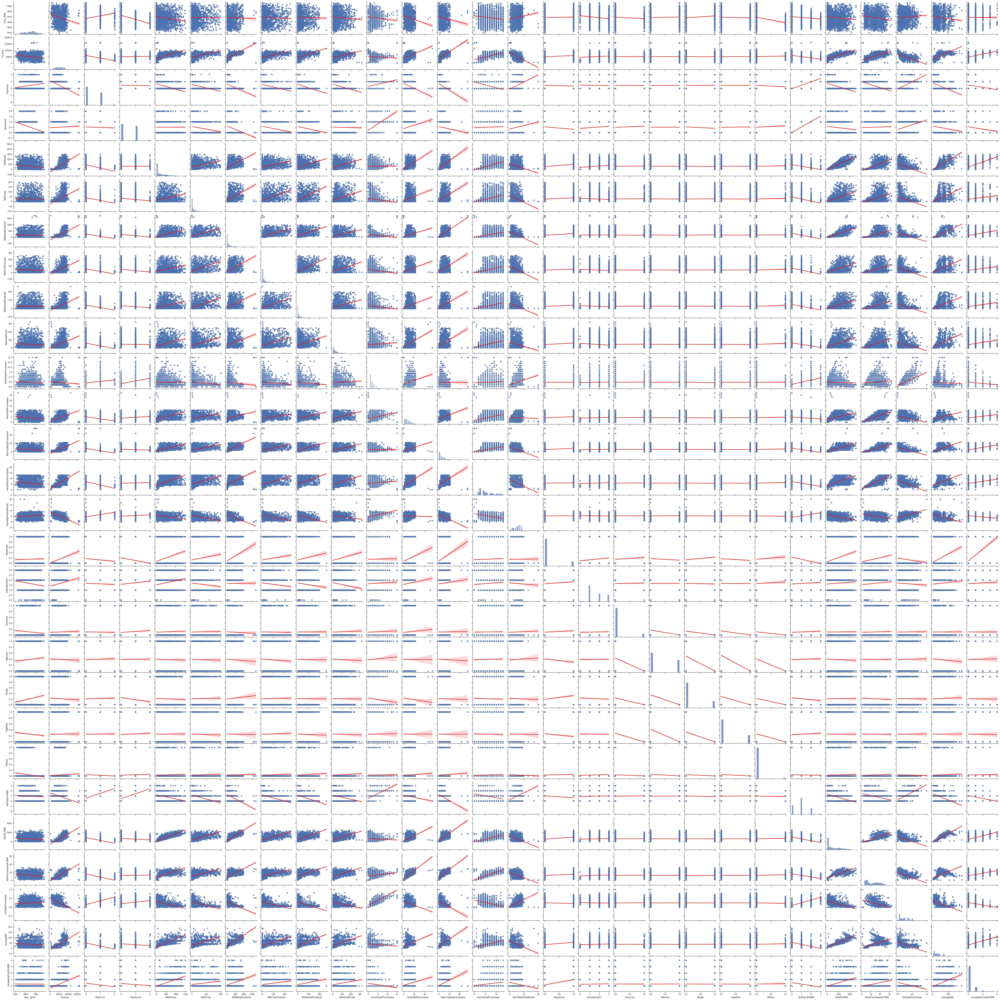

In [50]:
sns.set(style="ticks", color_codes=True)
sns.pairplot(main_data1, kind="reg", plot_kws={'line_kws':{'color':'red'}})

Для лучшей визуализации корреляционных матриц построим тепловые карты. 

<Axes: >

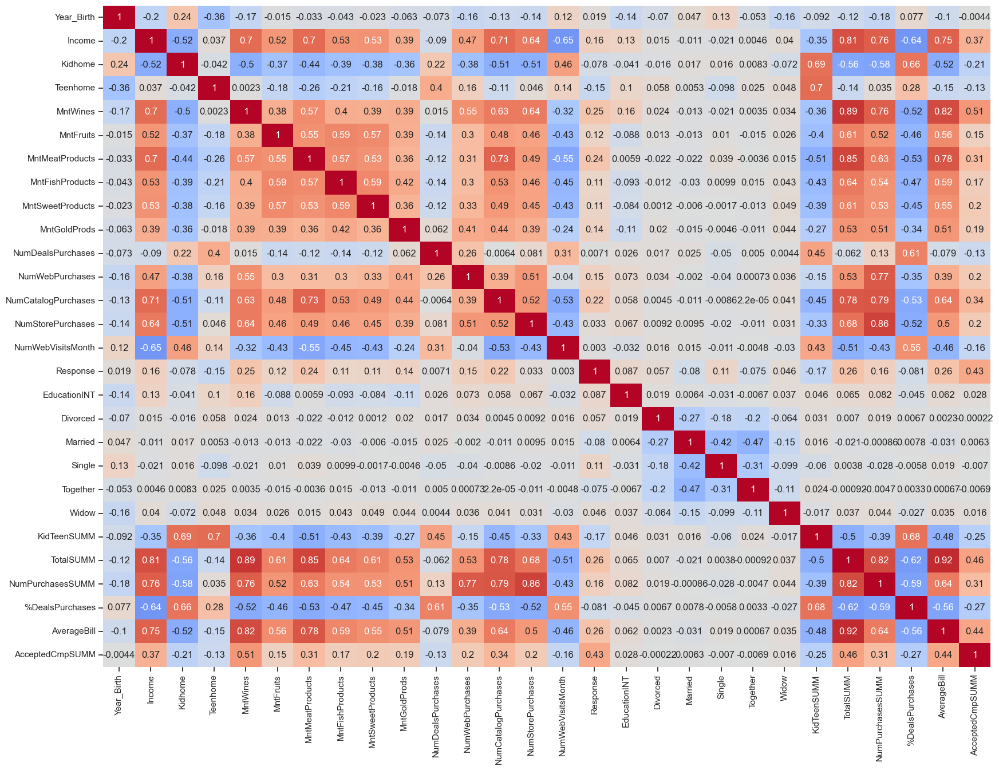

In [51]:
plt.figure(figsize=(20,15))
sns.heatmap(main_data1.corr(), vmax=1, vmin=-1, annot=True, cmap="coolwarm", cbar=False)

По тепловой карте явно видны характеристики, не влияющие на другие, например, год рождения, семейное положение, образование и пр. Поэтому на следующем этапе учтем эту информацию и сделаем кластеризацию по разным исходным данным (с учетом данных характеристик и без их учета).

# 4 этап: "Класстеризация"

Для оценки разбиения клиентов на кластеры (проверка на более четкие границы разделения кластеров) мы сделем несколько вариантов класстеризации:
- с малым количеством столбцов, исключив невлияющие характеристики исходя из данных, полученных на 3 этапе исследования - 20 столбцов,
- со средним количеством столбцов, исключив невлияющие характеристики исходя из данных, полученных на 3 этапе исследования - 26 столбцов,
- с максимальным количеством столбцов, исключив невлияющие характеристики исходя из данных, полученных на 3 этапе исследования - 35 столбцов.

Первый способ класстеризации на основе 20 столбцов.

In [52]:
data1 = main_data1.copy()
data1 = data1.drop(['Year_Birth', 'KidTeenSUMM', 'EducationINT', 'Married', 'Single', 'Together', 'Widow', 'Divorced' ], axis = 1)
data1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2203 entries, 0 to 2239
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Income               2203 non-null   float64
 1   Kidhome              2203 non-null   int64  
 2   Teenhome             2203 non-null   int64  
 3   MntWines             2203 non-null   int64  
 4   MntFruits            2203 non-null   int64  
 5   MntMeatProducts      2203 non-null   int64  
 6   MntFishProducts      2203 non-null   int64  
 7   MntSweetProducts     2203 non-null   int64  
 8   MntGoldProds         2203 non-null   int64  
 9   NumDealsPurchases    2203 non-null   int64  
 10  NumWebPurchases      2203 non-null   int64  
 11  NumCatalogPurchases  2203 non-null   int64  
 12  NumStorePurchases    2203 non-null   int64  
 13  NumWebVisitsMonth    2203 non-null   int64  
 14  Response             2203 non-null   int64  
 15  TotalSUMM            2203 non-null   int64 

In [53]:
dataResault1 = data1.copy()   # этот датасет будет использован позже при добавлении столбца с кластером

Стандартизировали оставшиеся данные

In [54]:
data1['Income'] = zscore(data1['Income']) 
data1['Kidhome'] = zscore(data1['Kidhome']) 
data1['Teenhome'] = zscore(data1['Teenhome']) 
data1['NumDealsPurchases'] = zscore(data1['NumDealsPurchases']) 
data1['NumWebPurchases'] = zscore(data1['NumWebPurchases']) 
data1['NumCatalogPurchases'] = zscore(data1['NumCatalogPurchases']) 
data1['NumStorePurchases'] = zscore(data1['NumStorePurchases']) 
data1['NumWebVisitsMonth'] = zscore(data1['NumWebVisitsMonth']) 
data1['Response'] = zscore(data1['Response']) 
data1['TotalSUMM'] = zscore(data1['TotalSUMM']) 
data1['NumPurchasesSUMM'] = zscore(data1['NumPurchasesSUMM']) 
data1['%DealsPurchases'] = zscore(data1['%DealsPurchases']) 
data1['AverageBill'] = zscore(data1['AverageBill']) 
data1['AcceptedCmpSUMM'] = zscore(data1['AcceptedCmpSUMM']) 
data1['MntWines'] = zscore(data1['MntWines']) 
data1['MntFruits'] = zscore(data1['MntFruits']) 
data1['MntMeatProducts'] = zscore(data1['MntMeatProducts']) 
data1['MntFishProducts'] = zscore(data1['MntFishProducts']) 
data1['MntSweetProducts'] = zscore(data1['MntSweetProducts']) 
data1['MntGoldProds'] = zscore(data1['MntGoldProds']) 

data1

,Income,Kidhome,Teenhome,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Response,TotalSUMM,NumPurchasesSUMM,%DealsPurchases,AverageBill,AcceptedCmpSUMM
Id,,,,,,,,,,,,,,,,,,,,
0,0.291562,-0.824032,-0.932400,0.974286,1.550890,1.687411,2.461356,1.480105,0.855916,0.368496,1.424124,2.504196,-0.563031,0.721782,2.373930,1.673849,1.308558,-0.607972,1.204999,-0.439500
1,-0.264519,1.037858,0.904878,-0.874572,-0.637713,-0.719321,-0.652210,-0.635099,-0.736178,-0.166990,-1.133097,-0.573009,-1.180277,-0.128759,-0.421242,-0.965314,-1.197700,1.504238,-1.026618,-0.439500
2,0.926901,-0.824032,-0.932400,0.355037,0.569792,-0.180035,1.344135,-0.148845,-0.037210,-0.702477,1.424124,-0.231097,1.288709,-0.554029,-0.421242,0.277915,1.030085,-1.109622,0.044892,-0.439500
3,-1.193270,1.037858,-0.932400,-0.874572,-0.562244,-0.656924,-0.505690,-0.586473,-0.755593,-0.166990,-0.767780,-0.914920,-0.563031,0.296512,-0.421242,-0.922158,-0.919227,0.536142,-0.956967,-0.439500
4,0.298870,1.037858,-0.932400,-0.394580,0.418854,-0.220147,0.153654,-0.002969,-0.561436,1.439470,0.328172,0.110815,0.054216,-0.128759,-0.421242,-0.309673,0.194666,0.674441,-0.244537,-0.439500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,0.437018,-0.824032,0.904878,1.193542,0.418854,0.065096,0.080394,2.209486,3.943023,-0.166990,1.789441,0.110815,-0.563031,-0.128759,-0.421242,1.215731,0.473139,-0.673979,1.549771,-0.439500
2236,0.568612,2.899749,0.904878,0.295779,-0.662869,-0.612355,-0.688841,-0.659411,-0.697346,2.510443,1.424124,-0.231097,-0.254408,0.721782,-0.421242,-0.273156,0.333902,1.310619,-0.262686,1.031956
2237,0.237010,-0.824032,-0.932400,1.783162,0.544636,0.221087,-0.102757,-0.367659,-0.386694,-0.702477,-0.767780,0.110815,2.214579,0.296512,-0.421242,1.049745,0.751612,-1.077352,1.052695,1.031956


In [55]:
lg1 = linkage(data1, method='ward', metric='euclidean')
lg1

array([[3.70000000e+01, 8.77000000e+02, 0.00000000e+00, 2.00000000e+00],
       [7.37000000e+02, 1.36500000e+03, 0.00000000e+00, 2.00000000e+00],
       [1.33400000e+03, 1.83800000e+03, 0.00000000e+00, 2.00000000e+00],
       ...,
       [4.39400000e+03, 4.39700000e+03, 5.20920427e+01, 5.89000000e+02],
       [4.40100000e+03, 4.40200000e+03, 9.81703648e+01, 1.15400000e+03],
       [4.40000000e+03, 4.40300000e+03, 1.69904967e+02, 2.20300000e+03]])

Нарисовали дендрограмму

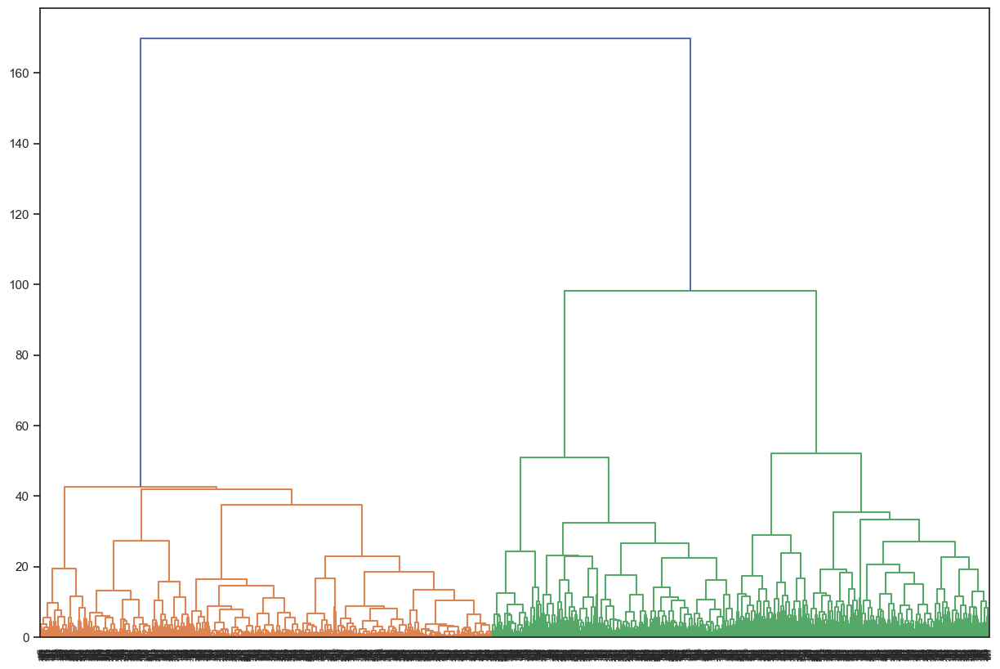

In [56]:
plt.figure(figsize=(15, 10))
dendrogram(lg1)

plt.show()

Провели отсечение на высоте 30

In [57]:
uroven1data1 = fcluster(lg1, 30, criterion='distance')

In [58]:
dataResault1['Cluster'] = uroven1data1
dataResault1

,Income,Kidhome,Teenhome,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Response,TotalSUMM,NumPurchasesSUMM,%DealsPurchases,AverageBill,AcceptedCmpSUMM,Cluster
Id,,,,,,,,,,,,,,,,,,,,,
0,58138.0,0,0,635,88,546,172,88,88,3,...,10,4,7,1,1617,22,0.136364,73.500000,0,8
1,46344.0,1,1,11,1,6,2,1,6,2,...,1,2,5,0,27,4,0.500000,6.750000,0,3
2,71613.0,0,0,426,49,127,111,21,42,1,...,2,10,4,0,776,20,0.050000,38.800000,0,9
3,26646.0,1,0,11,4,20,10,3,5,2,...,0,4,6,0,53,6,0.333333,8.833333,0,4
4,58293.0,1,0,173,43,118,46,27,15,5,...,3,6,5,0,422,14,0.357143,30.142857,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,61223.0,0,1,709,43,182,42,118,247,2,...,3,4,5,0,1341,16,0.125000,83.812500,0,9
2236,64014.0,2,1,406,0,30,0,0,8,7,...,2,5,7,0,444,15,0.466667,29.600000,1,5
2237,56981.0,0,0,908,48,217,32,12,24,1,...,3,13,6,0,1241,18,0.055556,68.944444,1,6


Сгруппировали по кластеру. Получилось 11 кластеров

In [59]:
ver1 = dataResault1.groupby(['Cluster']).mean()
ver1

,Income,Kidhome,Teenhome,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Response,TotalSUMM,NumPurchasesSUMM,%DealsPurchases,AverageBill,AcceptedCmpSUMM
Cluster,,,,,,,,,,,,,,,,,,,,
1,34041.711712,0.828829,0.387387,84.153153,7.045045,42.324324,8.549550,7.378378,25.783784,3.027027,3.108108,1.117117,3.306306,7.504505,1.000000,175.234234,7.531532,0.397783,19.659589,0.333333
2,45114.126050,0.176471,0.655462,115.701681,9.642857,50.810924,16.151261,9.592437,25.436975,1.844538,3.415966,1.163866,4.500000,5.563025,0.000000,227.336134,9.079832,0.212976,22.164475,0.092437
3,38333.826255,1.138996,0.992278,31.729730,2.474903,15.301158,3.706564,2.571429,9.876448,2.308880,1.733591,0.362934,3.096525,6.073359,0.000000,65.660232,5.193050,0.431717,11.353153,0.003861
4,28078.362812,0.823129,0.036281,19.242630,4.981859,17.444444,7.281179,4.975057,12.845805,1.671202,1.820862,0.319728,2.954649,6.825397,0.000000,66.770975,5.095238,0.321729,12.515034,0.079365
5,52970.743590,1.017094,1.025641,319.555556,12.290598,109.666667,20.905983,19.247863,47.726496,6.905983,5.521368,2.128205,6.085470,6.914530,0.094017,529.393162,13.735043,0.511703,35.820824,0.162393
6,59637.234375,0.125000,0.812500,677.914062,18.773438,148.781250,19.289062,18.640625,112.359375,2.992188,6.875000,3.718750,7.101562,6.585938,0.375000,995.757812,17.695312,0.177285,58.546089,0.671875
7,61488.400000,0.031250,0.968750,437.175000,24.518750,141.721875,33.768750,24.775000,42.437500,2.903125,6.037500,3.328125,8.103125,4.656250,0.000000,704.396875,17.468750,0.174130,40.136624,0.178125
8,79468.203488,0.034884,0.069767,759.191860,63.569767,515.261628,94.796512,69.593023,74.052326,1.081395,5.604651,6.296512,7.848837,3.209302,0.883721,1576.465116,19.750000,0.057482,83.289612,1.604651
9,65802.139130,0.217391,0.660870,546.252174,85.000000,251.286957,103.252174,70.095652,88.765217,2.660870,7.478261,4.286957,9.939130,5.026087,0.008696,1144.652174,21.704348,0.126645,53.087517,0.165217


In [60]:
dataResault1.groupby(['Cluster']).count()

,Income,Kidhome,Teenhome,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Response,TotalSUMM,NumPurchasesSUMM,%DealsPurchases,AverageBill,AcceptedCmpSUMM
Cluster,,,,,,,,,,,,,,,,,,,,
1,111,111,111,111,111,111,111,111,111,111,111,111,111,111,111,111,111,111,111,111
2,238,238,238,238,238,238,238,238,238,238,238,238,238,238,238,238,238,238,238,238
3,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259
4,441,441,441,441,441,441,441,441,441,441,441,441,441,441,441,441,441,441,441,441
5,117,117,117,117,117,117,117,117,117,117,117,117,117,117,117,117,117,117,117,117
6,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128
7,320,320,320,320,320,320,320,320,320,320,320,320,320,320,320,320,320,320,320,320
8,172,172,172,172,172,172,172,172,172,172,172,172,172,172,172,172,172,172,172,172
9,115,115,115,115,115,115,115,115,115,115,115,115,115,115,115,115,115,115,115,115


In [61]:
ver1.to_csv('Версия1.csv')

Для второго способа класстеризации мы оставили 26 столбцов


In [62]:
data2 = main_data1.copy()
data2 = data2.drop(['Year_Birth', 'KidTeenSUMM'], axis = 1)
data2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2203 entries, 0 to 2239
Data columns (total 26 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Income               2203 non-null   float64
 1   Kidhome              2203 non-null   int64  
 2   Teenhome             2203 non-null   int64  
 3   MntWines             2203 non-null   int64  
 4   MntFruits            2203 non-null   int64  
 5   MntMeatProducts      2203 non-null   int64  
 6   MntFishProducts      2203 non-null   int64  
 7   MntSweetProducts     2203 non-null   int64  
 8   MntGoldProds         2203 non-null   int64  
 9   NumDealsPurchases    2203 non-null   int64  
 10  NumWebPurchases      2203 non-null   int64  
 11  NumCatalogPurchases  2203 non-null   int64  
 12  NumStorePurchases    2203 non-null   int64  
 13  NumWebVisitsMonth    2203 non-null   int64  
 14  Response             2203 non-null   int64  
 15  EducationINT         2203 non-null   int64 

Также стандартизировали данные

In [63]:
dataResault2 = data2.copy()   # этот датасет будет использован позже при добавлении столбца с кластером
dataResault3 = data2.copy() 

In [64]:
data2['Income'] = zscore(data2['Income']) 
data2['Kidhome'] = zscore(data2['Kidhome']) 
data2['Teenhome'] = zscore(data2['Teenhome']) 
data2['NumDealsPurchases'] = zscore(data2['NumDealsPurchases']) 
data2['NumWebPurchases'] = zscore(data2['NumWebPurchases']) 
data2['NumCatalogPurchases'] = zscore(data2['NumCatalogPurchases']) 
data2['NumStorePurchases'] = zscore(data2['NumStorePurchases']) 
data2['NumWebVisitsMonth'] = zscore(data2['NumWebVisitsMonth']) 
data2['Response'] = zscore(data2['Response']) 
data2['EducationINT'] = zscore(data2['EducationINT']) 
data2['Divorced'] = zscore(data2['Divorced']) 
data2['Married'] = zscore(data2['Married']) 
data2['Single'] = zscore(data2['Single']) 
data2['Together'] = zscore(data2['Together']) 
data2['Widow'] = zscore(data2['Widow']) 
data2['TotalSUMM'] = zscore(data2['TotalSUMM']) 
data2['NumPurchasesSUMM'] = zscore(data2['NumPurchasesSUMM']) 
data2['%DealsPurchases'] = zscore(data2['%DealsPurchases']) 
data2['AverageBill'] = zscore(data2['AverageBill']) 
data2['AcceptedCmpSUMM'] = zscore(data2['AcceptedCmpSUMM']) 
data2['MntWines'] = zscore(data2['MntWines']) 
data2['MntFruits'] = zscore(data2['MntFruits']) 
data2['MntMeatProducts'] = zscore(data2['MntMeatProducts']) 
data2['MntFishProducts'] = zscore(data2['MntFishProducts']) 
data2['MntSweetProducts'] = zscore(data2['MntSweetProducts']) 
data2['MntGoldProds'] = zscore(data2['MntGoldProds']) 

data2

,Income,Kidhome,Teenhome,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,...,Divorced,Married,Single,Together,Widow,TotalSUMM,NumPurchasesSUMM,%DealsPurchases,AverageBill,AcceptedCmpSUMM
Id,,,,,,,,,,,,,,,,,,,,,
0,0.291562,-0.824032,-0.932400,0.974286,1.550890,1.687411,2.461356,1.480105,0.855916,0.368496,...,-0.339769,-0.796413,1.912461,-0.591504,-0.189027,1.673849,1.308558,-0.607972,1.204999,-0.439500
1,-0.264519,1.037858,0.904878,-0.874572,-0.637713,-0.719321,-0.652210,-0.635099,-0.736178,-0.166990,...,-0.339769,-0.796413,1.912461,-0.591504,-0.189027,-0.965314,-1.197700,1.504238,-1.026618,-0.439500
2,0.926901,-0.824032,-0.932400,0.355037,0.569792,-0.180035,1.344135,-0.148845,-0.037210,-0.702477,...,-0.339769,-0.796413,-0.522887,1.690605,-0.189027,0.277915,1.030085,-1.109622,0.044892,-0.439500
3,-1.193270,1.037858,-0.932400,-0.874572,-0.562244,-0.656924,-0.505690,-0.586473,-0.755593,-0.166990,...,-0.339769,-0.796413,-0.522887,1.690605,-0.189027,-0.922158,-0.919227,0.536142,-0.956967,-0.439500
4,0.298870,1.037858,-0.932400,-0.394580,0.418854,-0.220147,0.153654,-0.002969,-0.561436,1.439470,...,-0.339769,1.255631,-0.522887,-0.591504,-0.189027,-0.309673,0.194666,0.674441,-0.244537,-0.439500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,0.437018,-0.824032,0.904878,1.193542,0.418854,0.065096,0.080394,2.209486,3.943023,-0.166990,...,-0.339769,1.255631,-0.522887,-0.591504,-0.189027,1.215731,0.473139,-0.673979,1.549771,-0.439500
2236,0.568612,2.899749,0.904878,0.295779,-0.662869,-0.612355,-0.688841,-0.659411,-0.697346,2.510443,...,-0.339769,-0.796413,-0.522887,1.690605,-0.189027,-0.273156,0.333902,1.310619,-0.262686,1.031956
2237,0.237010,-0.824032,-0.932400,1.783162,0.544636,0.221087,-0.102757,-0.367659,-0.386694,-0.702477,...,2.943175,-0.796413,-0.522887,-0.591504,-0.189027,1.049745,0.751612,-1.077352,1.052695,1.031956


In [65]:
lg2 = linkage(data2, method='ward', metric='euclidean')
lg2

array([[6.69000000e+02, 8.67000000e+02, 0.00000000e+00, 2.00000000e+00],
       [3.76000000e+02, 9.11000000e+02, 0.00000000e+00, 2.00000000e+00],
       [5.50000000e+01, 2.18600000e+03, 0.00000000e+00, 2.00000000e+00],
       ...,
       [4.38900000e+03, 4.40000000e+03, 6.71399448e+01, 7.07000000e+02],
       [4.39600000e+03, 4.40200000e+03, 9.05464476e+01, 1.17800000e+03],
       [4.40100000e+03, 4.40300000e+03, 1.71095761e+02, 2.20300000e+03]])

Нарисовали дендрограмму

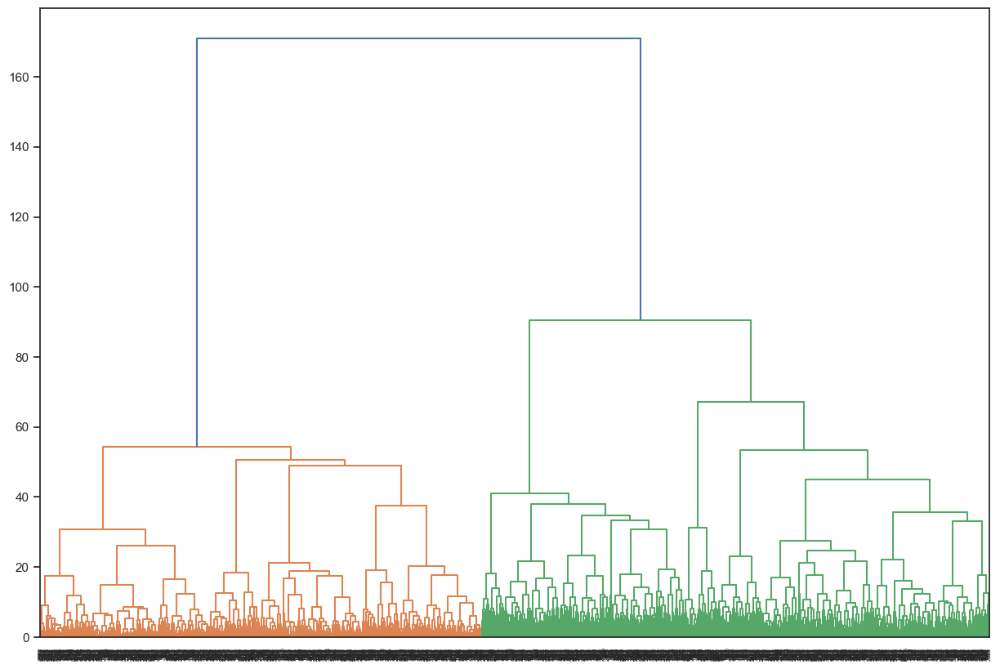

In [66]:
plt.figure(figsize=(15, 10))
dendrogram(lg2)

plt.show()

Провели отсечение на высоте 36

In [67]:
uroven1data2 = fcluster(lg2, 36, criterion='distance')

In [68]:
dataResault2['Cluster'] = uroven1data2
dataResault2

,Income,Kidhome,Teenhome,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,...,Married,Single,Together,Widow,TotalSUMM,NumPurchasesSUMM,%DealsPurchases,AverageBill,AcceptedCmpSUMM,Cluster
Id,,,,,,,,,,,,,,,,,,,,,
0,58138.0,0,0,635,88,546,172,88,88,3,...,0,1,0,0,1617,22,0.136364,73.500000,0,8
1,46344.0,1,1,11,1,6,2,1,6,2,...,0,1,0,0,27,4,0.500000,6.750000,0,5
2,71613.0,0,0,426,49,127,111,21,42,1,...,0,0,1,0,776,20,0.050000,38.800000,0,7
3,26646.0,1,0,11,4,20,10,3,5,2,...,0,0,1,0,53,6,0.333333,8.833333,0,3
4,58293.0,1,0,173,43,118,46,27,15,5,...,1,0,0,0,422,14,0.357143,30.142857,0,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,61223.0,0,1,709,43,182,42,118,247,2,...,1,0,0,0,1341,16,0.125000,83.812500,0,11
2236,64014.0,2,1,406,0,30,0,0,8,7,...,0,0,1,0,444,15,0.466667,29.600000,1,12
2237,56981.0,0,0,908,48,217,32,12,24,1,...,0,0,0,0,1241,18,0.055556,68.944444,1,10


И сгруппировали по кластеру. В данном варианте получилось 12 кластеров

In [69]:
ver2 = dataResault2.groupby(['Cluster']).mean()
ver2

,Income,Kidhome,Teenhome,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,...,Divorced,Married,Single,Together,Widow,TotalSUMM,NumPurchasesSUMM,%DealsPurchases,AverageBill,AcceptedCmpSUMM
Cluster,,,,,,,,,,,,,,,,,,,,,
1,35667.763959,0.746193,0.494924,50.954315,5.388325,24.378173,7.751269,5.395939,15.718274,2.093909,...,0.000000,1.000000,0.000000,0.000000,0.0,109.586294,6.263959,0.336297,14.830706,0.050761
2,37788.655172,0.767241,0.620690,72.422414,4.767241,30.586207,6.336207,4.965517,16.068966,2.534483,...,1.000000,0.000000,0.000000,0.000000,0.0,135.146552,6.896552,0.364148,15.590497,0.077586
3,34943.514768,0.755274,0.556962,40.561181,4.308017,20.050633,6.362869,4.118143,14.523207,1.881857,...,0.000000,0.000000,0.004219,0.995781,0.0,89.924051,5.624473,0.337982,14.700605,0.097046
4,32102.290698,0.906977,0.244186,55.360465,7.302326,34.941860,7.627907,6.674419,26.302326,2.697674,...,0.000000,0.348837,0.406977,0.244186,0.0,138.209302,6.872093,0.384100,17.683718,0.348837
5,33453.213542,0.812500,0.432292,34.937500,4.953125,21.697917,6.692708,5.041667,13.630208,2.057292,...,0.000000,0.000000,1.000000,0.000000,0.0,86.953125,5.703125,0.356217,13.225318,0.046875
6,82553.711538,0.115385,0.211538,974.846154,32.942308,375.750000,51.288462,45.326923,63.807692,1.173077,...,0.057692,0.519231,0.326923,0.096154,0.0,1543.961538,19.480769,0.070673,86.915474,2.692308
7,75417.751938,0.046512,0.240310,593.093023,64.046512,395.054264,99.100775,60.472868,67.023256,1.410853,...,0.000000,0.000000,0.000000,1.000000,0.0,1278.790698,19.093023,0.075203,69.674218,0.387597
8,77034.727586,0.031034,0.100000,613.127586,74.272414,520.600000,105.734483,71.996552,79.031034,1.282759,...,0.017241,0.475862,0.424138,0.082759,0.0,1464.762069,19.389655,0.066875,77.767168,0.662069
9,56481.552632,0.236842,0.644737,367.131579,31.868421,185.328947,49.907895,37.868421,55.855263,2.355263,...,0.000000,0.000000,0.000000,0.000000,1.0,727.960526,14.276316,0.216465,42.992631,0.355263


In [70]:
dataResault2.groupby(['Cluster']).count()

,Income,Kidhome,Teenhome,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,...,Divorced,Married,Single,Together,Widow,TotalSUMM,NumPurchasesSUMM,%DealsPurchases,AverageBill,AcceptedCmpSUMM
Cluster,,,,,,,,,,,,,,,,,,,,,
1,394,394,394,394,394,394,394,394,394,394,...,394,394,394,394,394,394,394,394,394,394
2,116,116,116,116,116,116,116,116,116,116,...,116,116,116,116,116,116,116,116,116,116
3,237,237,237,237,237,237,237,237,237,237,...,237,237,237,237,237,237,237,237,237,237
4,86,86,86,86,86,86,86,86,86,86,...,86,86,86,86,86,86,86,86,86,86
5,192,192,192,192,192,192,192,192,192,192,...,192,192,192,192,192,192,192,192,192,192
6,52,52,52,52,52,52,52,52,52,52,...,52,52,52,52,52,52,52,52,52,52
7,129,129,129,129,129,129,129,129,129,129,...,129,129,129,129,129,129,129,129,129,129
8,290,290,290,290,290,290,290,290,290,290,...,290,290,290,290,290,290,290,290,290,290
9,76,76,76,76,76,76,76,76,76,76,...,76,76,76,76,76,76,76,76,76,76


In [71]:
ver2.to_csv('Версия2.csv')

В третьем варианте провели отсечение на высоте 50

In [72]:
uroven2data2 = fcluster(lg2, 50, criterion='distance')

In [73]:
dataResault3['Cluster'] = uroven2data2
dataResault3

,Income,Kidhome,Teenhome,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,...,Married,Single,Together,Widow,TotalSUMM,NumPurchasesSUMM,%DealsPurchases,AverageBill,AcceptedCmpSUMM,Cluster
Id,,,,,,,,,,,,,,,,,,,,,
0,58138.0,0,0,635,88,546,172,88,88,3,...,0,1,0,0,1617,22,0.136364,73.500000,0,4
1,46344.0,1,1,11,1,6,2,1,6,2,...,0,1,0,0,27,4,0.500000,6.750000,0,3
2,71613.0,0,0,426,49,127,111,21,42,1,...,0,0,1,0,776,20,0.050000,38.800000,0,4
3,26646.0,1,0,11,4,20,10,3,5,2,...,0,0,1,0,53,6,0.333333,8.833333,0,3
4,58293.0,1,0,173,43,118,46,27,15,5,...,1,0,0,0,422,14,0.357143,30.142857,0,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,61223.0,0,1,709,43,182,42,118,247,2,...,1,0,0,0,1341,16,0.125000,83.812500,0,7
2236,64014.0,2,1,406,0,30,0,0,8,7,...,0,0,1,0,444,15,0.466667,29.600000,1,7
2237,56981.0,0,0,908,48,217,32,12,24,1,...,0,0,0,0,1241,18,0.055556,68.944444,1,6


Сгруппировав получили 6 кластеров

In [74]:
ver3 = dataResault3.groupby(['Cluster']).mean()
ver3

,Income,Kidhome,Teenhome,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,...,Divorced,Married,Single,Together,Widow,TotalSUMM,NumPurchasesSUMM,%DealsPurchases,AverageBill,AcceptedCmpSUMM
Cluster,,,,,,,,,,,,,,,,,,,,,
1,35667.763959,0.746193,0.494924,50.954315,5.388325,24.378173,7.751269,5.395939,15.718274,2.093909,...,0.000000,1.000000,0.000000,0.000000,0.0,109.586294,6.263959,0.336297,14.830706,0.050761
2,37788.655172,0.767241,0.620690,72.422414,4.767241,30.586207,6.336207,4.965517,16.068966,2.534483,...,1.000000,0.000000,0.000000,0.000000,0.0,135.146552,6.896552,0.364148,15.590497,0.077586
3,33913.450485,0.801942,0.458252,40.935922,5.048544,23.151456,6.697087,4.889320,16.157282,2.083495,...,0.000000,0.058252,0.442718,0.499029,0.0,96.879612,5.862136,0.352482,14.648746,0.120388
4,77201.176221,0.044586,0.150743,647.575372,66.908705,470.222930,97.906582,65.895966,74.061571,1.305732,...,0.016985,0.350318,0.297240,0.335456,0.0,1422.571125,19.318471,0.069575,76.560632,0.811040
5,56481.552632,0.236842,0.644737,367.131579,31.868421,185.328947,49.907895,37.868421,55.855263,2.355263,...,0.000000,0.000000,0.000000,0.000000,1.0,727.960526,14.276316,0.216465,42.992631,0.355263
6,67391.923077,0.048077,0.596154,574.942308,48.201923,274.586538,64.144231,47.086538,77.557692,2.336538,...,1.000000,0.000000,0.000000,0.000000,0.0,1086.519231,19.442308,0.121481,57.592282,0.326923
7,58614.884250,0.256167,0.821632,440.675522,26.231499,151.000000,36.129032,29.825427,62.952562,3.537002,...,0.000000,0.504744,0.199241,0.296015,0.0,746.814042,17.588235,0.214169,41.755723,0.235294


In [75]:
dataResault3.groupby(['Cluster']).count()

,Income,Kidhome,Teenhome,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,...,Divorced,Married,Single,Together,Widow,TotalSUMM,NumPurchasesSUMM,%DealsPurchases,AverageBill,AcceptedCmpSUMM
Cluster,,,,,,,,,,,,,,,,,,,,,
1,394,394,394,394,394,394,394,394,394,394,...,394,394,394,394,394,394,394,394,394,394
2,116,116,116,116,116,116,116,116,116,116,...,116,116,116,116,116,116,116,116,116,116
3,515,515,515,515,515,515,515,515,515,515,...,515,515,515,515,515,515,515,515,515,515
4,471,471,471,471,471,471,471,471,471,471,...,471,471,471,471,471,471,471,471,471,471
5,76,76,76,76,76,76,76,76,76,76,...,76,76,76,76,76,76,76,76,76,76
6,104,104,104,104,104,104,104,104,104,104,...,104,104,104,104,104,104,104,104,104,104
7,527,527,527,527,527,527,527,527,527,527,...,527,527,527,527,527,527,527,527,527,527


In [76]:
ver3.to_csv('Версия3.csv')

Для четвертого способа класстеризации мы взяли 35 столбцов

In [77]:
main_data2 = main_data.drop(['Dt_Customer','Education', 'Marital_Status'], axis = 1)

In [78]:
data3 = main_data2.copy()
data3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2203 entries, 0 to 2239
Data columns (total 35 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Year_Birth           2203 non-null   int64  
 1   Income               2203 non-null   float64
 2   Kidhome              2203 non-null   int64  
 3   Teenhome             2203 non-null   int64  
 4   Recency              2203 non-null   int64  
 5   MntWines             2203 non-null   int64  
 6   MntFruits            2203 non-null   int64  
 7   MntMeatProducts      2203 non-null   int64  
 8   MntFishProducts      2203 non-null   int64  
 9   MntSweetProducts     2203 non-null   int64  
 10  MntGoldProds         2203 non-null   int64  
 11  NumDealsPurchases    2203 non-null   int64  
 12  NumWebPurchases      2203 non-null   int64  
 13  NumCatalogPurchases  2203 non-null   int64  
 14  NumStorePurchases    2203 non-null   int64  
 15  NumWebVisitsMonth    2203 non-null   int64 

In [79]:
dataResault4 = data3.copy() 

Привели к нормализованному виду

In [80]:
data3['Year_Birth'] = zscore(data3['Year_Birth']) 
data3['Income'] = zscore(data3['Income']) 
data3['Kidhome'] = zscore(data3['Kidhome']) 
data3['Teenhome'] = zscore(data3['Teenhome']) 
data3['Recency'] = zscore(data3['Recency']) 
data3['MntWines'] = zscore(data3['MntWines']) 
data3['MntFruits'] = zscore(data3['MntFruits']) 
data3['MntMeatProducts'] = zscore(data3['MntMeatProducts']) 
data3['MntFishProducts'] = zscore(data3['MntFishProducts']) 
data3['MntSweetProducts'] = zscore(data3['MntSweetProducts']) 
data3['MntGoldProds'] = zscore(data3['MntGoldProds']) 
data3['NumDealsPurchases'] = zscore(data3['NumDealsPurchases']) 
data3['NumWebPurchases'] = zscore(data3['NumWebPurchases']) 
data3['NumCatalogPurchases'] = zscore(data3['NumCatalogPurchases']) 
data3['NumStorePurchases'] = zscore(data3['NumStorePurchases']) 
data3['NumWebVisitsMonth'] = zscore(data3['NumWebVisitsMonth']) 
data3['AcceptedCmp3'] = zscore(data3['AcceptedCmp3']) 
data3['AcceptedCmp1'] = zscore(data3['AcceptedCmp1']) 
data3['AcceptedCmp2'] = zscore(data3['AcceptedCmp2']) 
data3['AcceptedCmp4'] = zscore(data3['AcceptedCmp4']) 
data3['AcceptedCmp5'] = zscore(data3['AcceptedCmp5']) 
data3['Complain'] = zscore(data3['Complain']) 
data3['Response'] = zscore(data3['Response']) 
data3['EducationINT'] = zscore(data3['EducationINT']) 
data3['Divorced'] = zscore(data3['Divorced']) 
data3['Married'] = zscore(data3['Married']) 
data3['Single'] = zscore(data3['Single']) 
data3['Together'] = zscore(data3['Together']) 
data3['Widow'] = zscore(data3['Widow']) 
data3['KidTeenSUMM'] = zscore(data3['KidTeenSUMM']) 
data3['TotalSUMM'] = zscore(data3['TotalSUMM']) 
data3['NumPurchasesSUMM'] = zscore(data3['NumPurchasesSUMM']) 
data3['%DealsPurchases'] = zscore(data3['%DealsPurchases']) 
data3['AverageBill'] = zscore(data3['AverageBill']) 
data3['AcceptedCmpSUMM'] = zscore(data3['AcceptedCmpSUMM']) 

data3

,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,...,Married,Single,Together,Widow,KidTeenSUMM,TotalSUMM,NumPurchasesSUMM,%DealsPurchases,AverageBill,AcceptedCmpSUMM
Id,,,,,,,,,,,,,,,,,,,,,
0,-1.018517,0.291562,-0.824032,-0.932400,0.311051,0.974286,1.550890,1.687411,2.461356,1.480105,...,-0.796413,1.912461,-0.591504,-0.189027,-1.269156,1.673849,1.308558,-0.607972,1.204999,-0.439500
1,-1.275156,-0.264519,1.037858,0.904878,-0.379476,-0.874572,-0.637713,-0.719321,-0.652210,-0.635099,...,-0.796413,1.912461,-0.591504,-0.189027,1.402560,-0.965314,-1.197700,1.504238,-1.026618,-0.439500
2,-0.334147,0.926901,-0.824032,-0.932400,-0.793793,0.355037,0.569792,-0.180035,1.344135,-0.148845,...,-0.796413,-0.522887,1.690605,-0.189027,-1.269156,0.277915,1.030085,-1.109622,0.044892,-0.439500
3,1.291233,-1.193270,1.037858,-0.932400,-0.793793,-0.874572,-0.562244,-0.656924,-0.505690,-0.586473,...,-0.796413,-0.522887,1.690605,-0.189027,0.066702,-0.922158,-0.919227,0.536142,-0.956967,-0.439500
4,1.034594,0.298870,1.037858,-0.932400,1.553999,-0.394580,0.418854,-0.220147,0.153654,-0.002969,...,1.255631,-0.522887,-0.591504,-0.189027,0.066702,-0.309673,0.194666,0.674441,-0.244537,-0.439500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,-0.163054,0.437018,-0.824032,0.904878,-0.103266,1.193542,0.418854,0.065096,0.080394,2.209486,...,1.255631,-0.522887,-0.591504,-0.189027,0.066702,1.215731,0.473139,-0.673979,1.549771,-0.439500
2236,-1.959527,0.568612,2.899749,0.904878,0.241998,0.295779,-0.662869,-0.612355,-0.688841,-0.659411,...,-0.796413,-0.522887,1.690605,-0.189027,2.738418,-0.273156,0.333902,1.310619,-0.262686,1.031956
2237,1.034594,0.237010,-0.824032,-0.932400,1.450420,1.783162,0.544636,0.221087,-0.102757,-0.367659,...,-0.796413,-0.522887,-0.591504,-0.189027,-1.269156,1.049745,0.751612,-1.077352,1.052695,1.031956


In [81]:
lg3 = linkage(data3, method='ward', metric='euclidean')
lg3

array([[1.60800000e+03, 2.18300000e+03, 0.00000000e+00, 2.00000000e+00],
       [3.06000000e+02, 2.19700000e+03, 0.00000000e+00, 2.00000000e+00],
       [4.04000000e+02, 1.49900000e+03, 0.00000000e+00, 2.00000000e+00],
       ...,
       [4.39100000e+03, 4.39800000e+03, 7.75480775e+01, 8.52000000e+02],
       [4.40100000e+03, 4.40200000e+03, 1.00080940e+02, 1.07000000e+03],
       [4.40000000e+03, 4.40300000e+03, 1.69254156e+02, 2.20300000e+03]])

Нарисовали дендрограмму

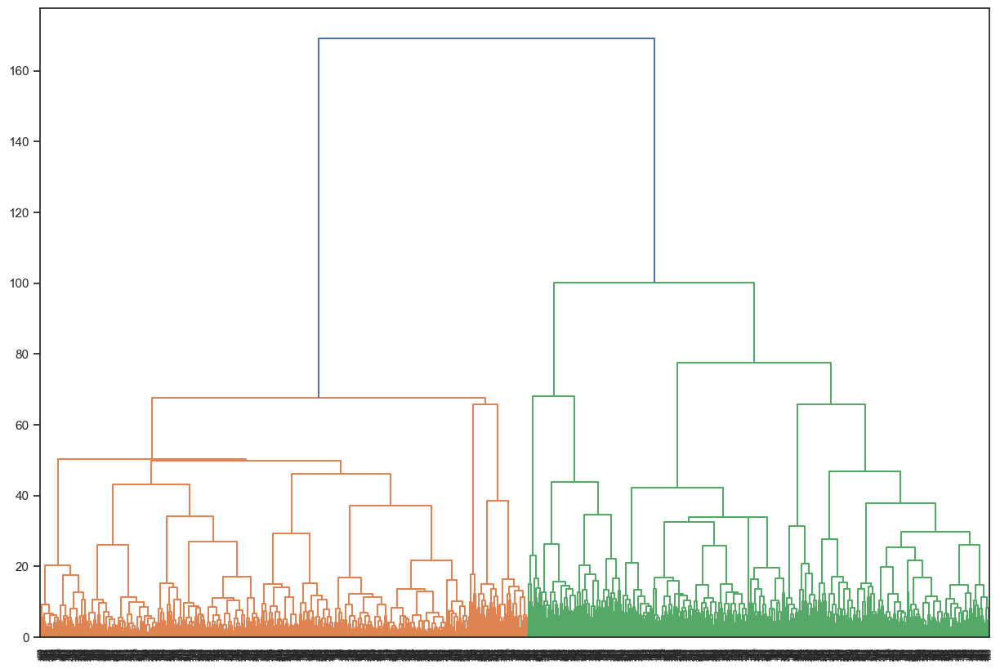

In [82]:
plt.figure(figsize=(15, 10))
dendrogram(lg3)

plt.show()

Провели отсечение на высоте 60

In [83]:
uroven1data3 = fcluster(lg3, 60, criterion='distance')

In [84]:
dataResault4['Cluster'] = uroven1data3
dataResault4

,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,...,Single,Together,Widow,KidTeenSUMM,TotalSUMM,NumPurchasesSUMM,%DealsPurchases,AverageBill,AcceptedCmpSUMM,Cluster
Id,,,,,,,,,,,,,,,,,,,,,
0,1957,58138.0,0,0,58,635,88,546,172,88,...,1,0,0,0,1617,22,0.136364,73.500000,0,6
1,1954,46344.0,1,1,38,11,1,6,2,1,...,1,0,0,2,27,4,0.500000,6.750000,0,1
2,1965,71613.0,0,0,26,426,49,127,111,21,...,0,1,0,0,776,20,0.050000,38.800000,0,6
3,1984,26646.0,1,0,26,11,4,20,10,3,...,0,1,0,1,53,6,0.333333,8.833333,0,1
4,1981,58293.0,1,0,94,173,43,118,46,27,...,0,0,0,1,422,14,0.357143,30.142857,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,1967,61223.0,0,1,46,709,43,182,42,118,...,0,0,0,1,1341,16,0.125000,83.812500,0,8
2236,1946,64014.0,2,1,56,406,0,30,0,0,...,0,1,0,3,444,15,0.466667,29.600000,1,8
2237,1981,56981.0,0,0,91,908,48,217,32,12,...,0,0,0,0,1241,18,0.055556,68.944444,1,8


Сгруппировали и получили 8 кластеров. Данный вариант оказался самым лучшим

In [85]:
pd.set_option('display.max_columns', None)
ver4 = dataResault4.groupby(['Cluster']).mean()
ver4

,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,EducationINT,Divorced,Married,Single,Together,Widow,KidTeenSUMM,TotalSUMM,NumPurchasesSUMM,%DealsPurchases,AverageBill,AcceptedCmpSUMM
Cluster,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,1970.987940,36293.538693,0.739698,0.493467,48.513568,58.577889,6.315578,30.153769,9.340704,6.284422,16.912563,2.184925,2.409045,0.652261,3.610050,6.289447,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.069347,1.601005,0.111558,0.419095,0.204020,0.265327,0.000000,1.233166,127.584925,6.671357,0.336261,15.784402,0.000000
2,1968.350000,45672.400000,0.650000,0.550000,50.750000,176.700000,25.100000,117.700000,26.700000,18.200000,27.600000,2.400000,3.700000,2.100000,5.400000,5.850000,0.100000,0.000000,0.050000,0.000000,0.0,1.0,0.150000,1.350000,0.050000,0.400000,0.300000,0.250000,0.000000,1.200000,392.000000,11.200000,0.307582,24.580791,0.150000
3,1970.830508,41236.330508,0.576271,0.500000,42.940678,246.533898,13.805085,80.771186,21.771186,12.313559,55.000000,2.500000,4.228814,2.694915,4.127119,6.788136,1.000000,0.000000,0.000000,0.008475,0.0,0.0,0.432203,1.703390,0.127119,0.381356,0.237288,0.254237,0.000000,1.076271,430.194915,11.050847,0.297539,28.776583,1.008475
4,1968.133333,71054.833333,0.066667,0.433333,48.666667,898.666667,22.966667,250.300000,38.733333,30.600000,66.400000,1.700000,4.900000,5.166667,8.166667,5.166667,0.233333,0.733333,0.566667,0.433333,1.0,0.0,0.666667,1.800000,0.166667,0.233333,0.166667,0.400000,0.033333,0.500000,1307.666667,18.233333,0.109504,73.309297,2.966667
5,1969.308511,81068.952128,0.047872,0.106383,49.468085,807.361702,60.686170,491.351064,90.388298,69.180851,76.212766,1.031915,5.510638,6.026596,8.319149,2.840426,0.154255,0.244681,0.723404,0.531915,0.0,0.0,0.457447,1.675532,0.069149,0.436170,0.234043,0.260638,0.000000,0.154255,1595.180851,19.856383,0.055721,84.161706,1.654255
6,1968.497368,72736.560526,0.042105,0.326316,49.863158,499.544737,68.752632,411.207895,96.842105,67.047368,76.686842,1.789474,5.302632,5.660526,8.494737,3.157895,0.007895,0.018421,0.000000,0.002632,0.0,0.0,0.126316,1.584211,0.186842,0.342105,0.213158,0.255263,0.002632,0.368421,1220.081579,19.457895,0.090533,65.085858,0.028947
7,1958.594595,56046.932432,0.243243,0.662162,48.689189,345.121622,31.689189,178.378378,48.743243,36.689189,54.932432,2.391892,4.594595,3.283784,6.310811,4.945946,0.054054,0.108108,0.081081,0.067568,0.0,0.0,0.229730,1.824324,0.000000,0.000000,0.000000,0.000000,1.000000,0.905405,695.554054,14.189189,0.220707,41.106332,0.310811
8,1965.334171,58803.482412,0.283920,0.881910,50.912060,476.077889,22.776382,144.572864,29.891960,24.027638,58.673367,3.703518,6.351759,3.025126,7.889447,5.655779,0.000000,0.203518,0.000000,0.052764,0.0,0.0,0.095477,1.859296,0.030151,0.417085,0.266332,0.286432,0.000000,1.165829,756.020101,17.266332,0.227781,43.038578,0.256281


In [86]:
dataResault4.groupby(['Cluster']).count()

,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,EducationINT,Divorced,Married,Single,Together,Widow,KidTeenSUMM,TotalSUMM,NumPurchasesSUMM,%DealsPurchases,AverageBill,AcceptedCmpSUMM
Cluster,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,995,995,995,995,995,995,995,995,995,995,995,995,995,995,995,995,995,995,995,995,995,995,995,995,995,995,995,995,995,995,995,995,995,995,995
2,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20
3,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118
4,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30
5,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188
6,380,380,380,380,380,380,380,380,380,380,380,380,380,380,380,380,380,380,380,380,380,380,380,380,380,380,380,380,380,380,380,380,380,380,380
7,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74
8,398,398,398,398,398,398,398,398,398,398,398,398,398,398,398,398,398,398,398,398,398,398,398,398,398,398,398,398,398,398,398,398,398,398,398


In [87]:
ver4.to_csv('Версия4.csv')

При анализе полученных четырех кластеризаций выбрали именно 4 вариант.

### Для больше визуализации можем рассмотреть деление на кластеры в таком виде (красным выделены максимальные значения по каждой характеристике, голубым- минимальные, зеленым - средние):
- это разбиение по выбранной четвертой версии кластеризации (8 кластеров по 35 столбцам с характеристиками)

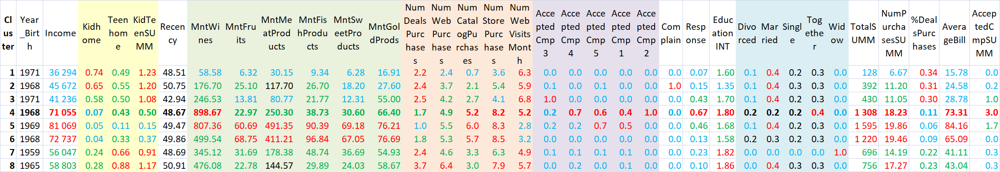3.04	0.3


Для информации приводим данные других вариантов кластеризации:
- это разбиение по невыбранной третьей версии кластеризации (7 кластеров по 26 столбцам с характеристиками):

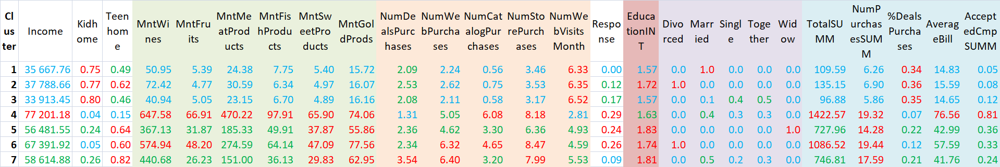	0.24



- это разбиение по невыбранной второй версии кластеризации (12 кластеров по 26 столбцам с характеристиками):

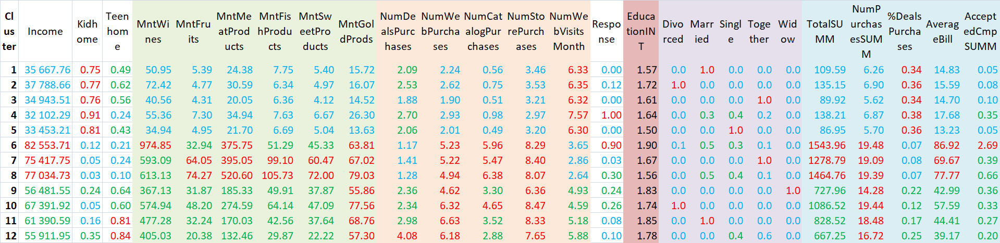	39.17	0.20


- это разбиение по невыбранной первой версии кластеризации (11 кластеров по 20 столбцам с характеристиками):

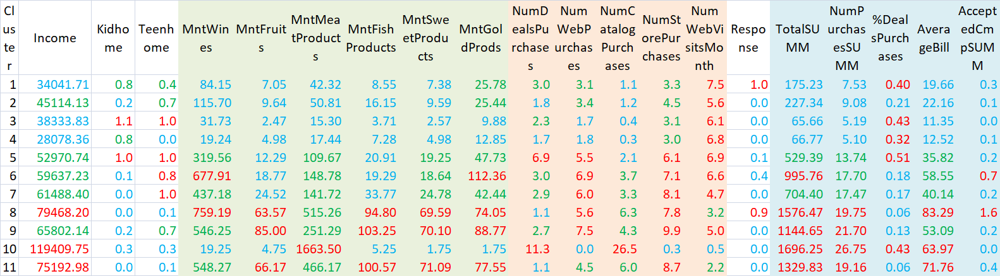	71.76	0.4


### По представленным данным по кластеризации на 8 кластеров можем увидеть (выбранный вариант №4):
- укрупненно клиенты разбиты на три группы по сумме дохода семьи (низкий, средний, высокий), в зависимости от которого складывается определенная модель покупательского поведения клиента,
- внутри каждой из этих трех групп идет деление на подгруппы в зависимости от других особеностей клиента (наличие детей, сумма трат, количество покупок, способы совершения покупок, характер реакции на маркетинговые акции, жалобы клиента и пр.).
  

### Рассмотрим кластеры подробнее.

Кластеры 1,2,3 -  это люди с зарплатой около 40 тысяч долларов, имеющих как минимум одного ребенка, с большими тратами на вино и мясо. Эти клиенты заходят часто на сайт, вероятнее для поиска скидок. Между собой разнятся в основном суммами, которые они тратят на покупки в каждой категории товаров. Второй кластер отличается от 1 и 3 тем, что чаще  делает покупки в самом магазине, и тем, что только в этом кластере присутствуют жалующиеся клиенты. А третий кластер отличается от первого тем, что чаще участвует в проводимых акциях магазина и реагирует на таргетную рекламу.

Кластеры 4,5,6 так же похожи между собой: это люди с зарплатой больше 70 тысяч долларов, у каждого второго есть ребенок. В основном они покупают товары в магазине или по каталогу. Клиенты этих кластеров приносят магазину самую большую выручку по сравнению с другими кластерами. Они также как и первая группа кластеров тратят большую сумму на вино и мясо. Между собой кластеры разнятся в основном суммами, которые они тратят на покупки в каждой категории товаров. Так же разница в кластерах этой группы - в их посещении сайта и в участии в акциях. Больше всего выделяется 4 группа, она тратит 69% на вино и это определенно мясоеды, их траты на рыбу в общих их тратах существенно меньше, чем у других. Клиенты 6 кластера из этой подгруппы меньше чем 4 и 5 покупают вино и не откликаются ни на рекламные акции магазина, ни на перснальные рассылки.

Кластеры 7 и 8 - это люди с доходом около 57 тысяч долларов, имеющее высшее образование, у которых есть как минимум один ребенок. Так же они чаще заходят на сайт и покупают по скидке, но основная часть покупок по факту в магазине.

### Для лучшей визуализации правильного выбора, построим парные графики с использованием матрицы рассеивания.

Text(0.5, 1.0, 'ЗАВИСИМОСТЬ СУММЫ ПОКУПОК ОТ ДОХОДА')

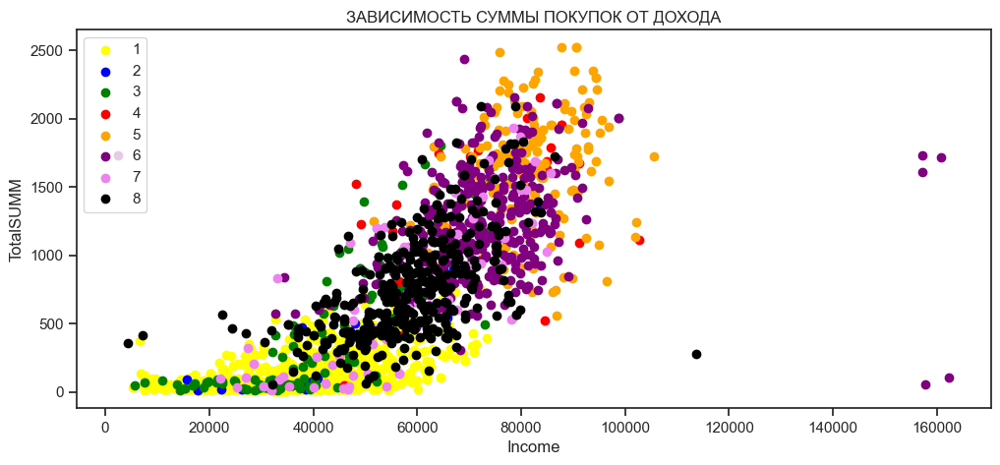

In [88]:
plt.figure(figsize=(12,5))
df1 = dataResault4[ dataResault4['Cluster'] == 1 ]
df2 = dataResault4[ dataResault4['Cluster'] == 2 ]
df3 = dataResault4[ dataResault4['Cluster'] == 3 ]
df4 = dataResault4[ dataResault4['Cluster'] == 4 ]
df5 = dataResault4[ dataResault4['Cluster'] == 5 ]
df6 = dataResault4[ dataResault4['Cluster'] == 6 ]
df7 = dataResault4[ dataResault4['Cluster'] == 7 ]
df8 = dataResault4[ dataResault4['Cluster'] == 8 ]
plt.scatter(df1['Income'], df1['TotalSUMM'] , color='yellow', label='1')
plt.scatter(df2['Income'], df2['TotalSUMM'] ,  color='blue', label='2')
plt.scatter(df3['Income'], df3['TotalSUMM'] ,  color='green', label='3')
plt.scatter(df4['Income'], df4['TotalSUMM'] ,  color='red', label='4')
plt.scatter(df5['Income'], df5['TotalSUMM'] ,  color='orange', label='5')
plt.scatter(df6['Income'], df6['TotalSUMM'] ,  color='purple', label='6')
plt.scatter(df7['Income'], df7['TotalSUMM'] ,  color='violet', label='7')
plt.scatter(df8['Income'], df8['TotalSUMM'] ,  color='black', label='8')
plt.legend()
plt.xlabel('Income')
plt.ylabel('TotalSUMM')
plt.title('ЗАВИСИМОСТЬ СУММЫ ПОКУПОК ОТ ДОХОДА')

Text(0.5, 1.0, 'ЗАВИСИМОСТЬ КОЛИЧЕСТВА ПОКУПОК ОТ ДОХОДА')

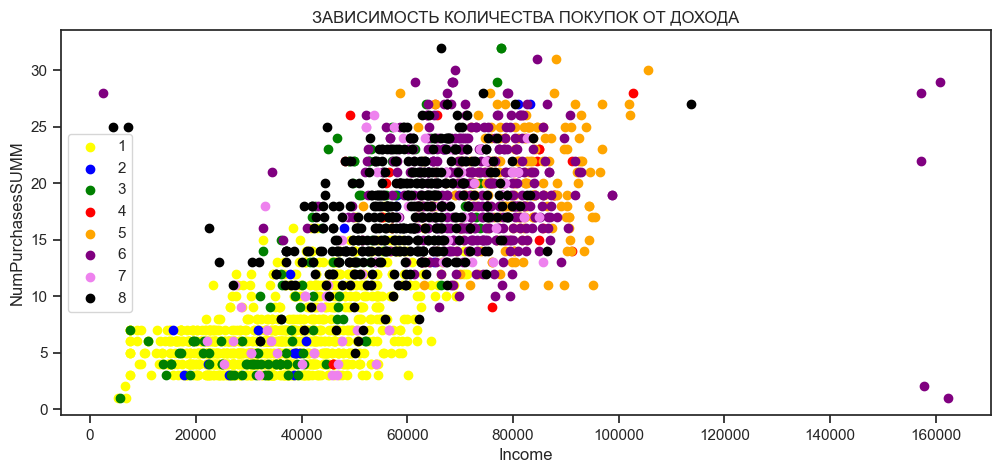

In [89]:
plt.figure(figsize=(12,5))
df1 = dataResault4[ dataResault4['Cluster'] == 1 ]
df2 = dataResault4[ dataResault4['Cluster'] == 2 ]
df3 = dataResault4[ dataResault4['Cluster'] == 3 ]
df4 = dataResault4[ dataResault4['Cluster'] == 4 ]
df5 = dataResault4[ dataResault4['Cluster'] == 5 ]
df6 = dataResault4[ dataResault4['Cluster'] == 6 ]
df7 = dataResault4[ dataResault4['Cluster'] == 7 ]
df8 = dataResault4[ dataResault4['Cluster'] == 8 ]
plt.scatter(df1['Income'], df1['NumPurchasesSUMM'] , color='yellow', label='1')
plt.scatter(df2['Income'], df2['NumPurchasesSUMM'] ,  color='blue', label='2')
plt.scatter(df3['Income'], df3['NumPurchasesSUMM'] ,  color='green', label='3')
plt.scatter(df4['Income'], df4['NumPurchasesSUMM'] ,  color='red', label='4')
plt.scatter(df5['Income'], df5['NumPurchasesSUMM'] ,  color='orange', label='5')
plt.scatter(df6['Income'], df6['NumPurchasesSUMM'] ,  color='purple', label='6')
plt.scatter(df7['Income'], df7['NumPurchasesSUMM'] ,  color='violet', label='7')
plt.scatter(df8['Income'], df8['NumPurchasesSUMM'] ,  color='black', label='8')
plt.legend()
plt.xlabel('Income')
plt.ylabel('NumPurchasesSUMM')
plt.title('ЗАВИСИМОСТЬ КОЛИЧЕСТВА ПОКУПОК ОТ ДОХОДА')

Text(0.5, 1.0, 'ЗАВИСИМОСТЬ СУММЫ, ПОТРАЧЕННОЙ НА ВИНО, ОТ ДОХОДА')

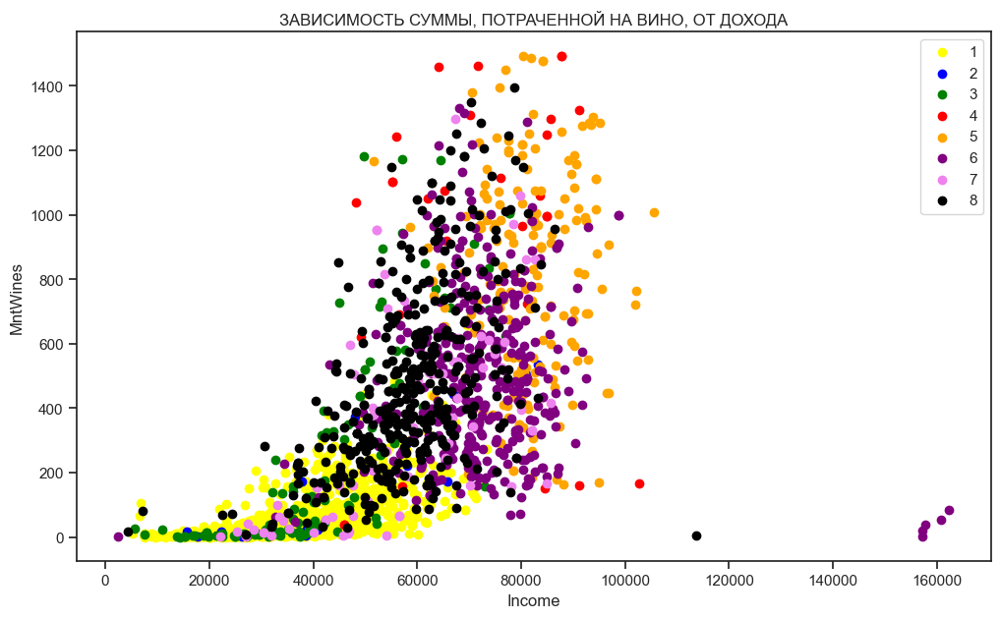

In [90]:
plt.figure(figsize=(12,7))
df1 = dataResault4[ dataResault4['Cluster'] == 1 ]
df2 = dataResault4[ dataResault4['Cluster'] == 2 ]
df3 = dataResault4[ dataResault4['Cluster'] == 3 ]
df4 = dataResault4[ dataResault4['Cluster'] == 4 ]
df5 = dataResault4[ dataResault4['Cluster'] == 5 ]
df6 = dataResault4[ dataResault4['Cluster'] == 6 ]
df7 = dataResault4[ dataResault4['Cluster'] == 7 ]
df8 = dataResault4[ dataResault4['Cluster'] == 8 ]
plt.scatter(df1['Income'], df1['MntWines'] , color='yellow', label='1')
plt.scatter(df2['Income'], df2['MntWines'] ,  color='blue', label='2')
plt.scatter(df3['Income'], df3['MntWines'] ,  color='green', label='3')
plt.scatter(df4['Income'], df4['MntWines'] ,  color='red', label='4')
plt.scatter(df5['Income'], df5['MntWines'] ,  color='orange', label='5')
plt.scatter(df6['Income'], df6['MntWines'] ,  color='purple', label='6')
plt.scatter(df7['Income'], df7['MntWines'] ,  color='violet', label='7')
plt.scatter(df8['Income'], df8['MntWines'] ,  color='black', label='8')
plt.legend()
plt.xlabel('Income')
plt.ylabel('MntWines')
plt.title('ЗАВИСИМОСТЬ СУММЫ, ПОТРАЧЕННОЙ НА ВИНО, ОТ ДОХОДА')

Text(0.5, 1.0, 'ЗАВИСИМОСТЬ СУММЫ, ПОТРАЧЕННОЙ НА МЯСО, ОТ СУММЫ ПОКУПОК')

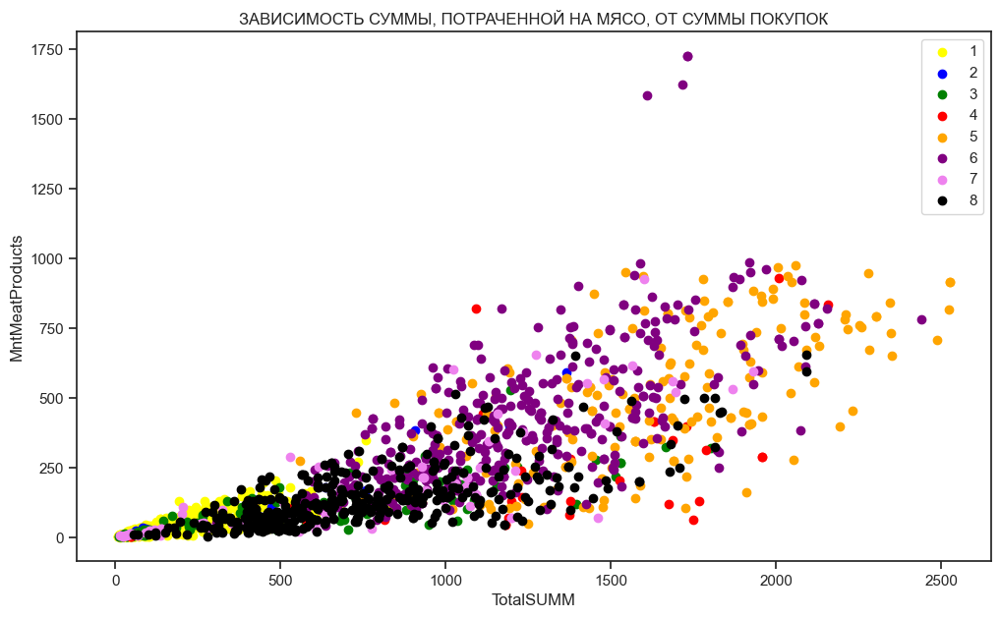

In [91]:
plt.figure(figsize=(12,7))
df1 = dataResault4[ dataResault4['Cluster'] == 1 ]
df2 = dataResault4[ dataResault4['Cluster'] == 2 ]
df3 = dataResault4[ dataResault4['Cluster'] == 3 ]
df4 = dataResault4[ dataResault4['Cluster'] == 4 ]
df5 = dataResault4[ dataResault4['Cluster'] == 5 ]
df6 = dataResault4[ dataResault4['Cluster'] == 6 ]
df7 = dataResault4[ dataResault4['Cluster'] == 7 ]
df8 = dataResault4[ dataResault4['Cluster'] == 8 ]
plt.scatter(df1['TotalSUMM'], df1['MntMeatProducts'] , color='yellow', label='1')
plt.scatter(df2['TotalSUMM'], df2['MntMeatProducts'] ,  color='blue', label='2')
plt.scatter(df3['TotalSUMM'], df3['MntMeatProducts'] ,  color='green', label='3')
plt.scatter(df4['TotalSUMM'], df4['MntMeatProducts'] ,  color='red', label='4')
plt.scatter(df5['TotalSUMM'], df5['MntMeatProducts'] ,  color='orange', label='5')
plt.scatter(df6['TotalSUMM'], df6['MntMeatProducts'] ,  color='purple', label='6')
plt.scatter(df7['TotalSUMM'], df7['MntMeatProducts'] ,  color='violet', label='7')
plt.scatter(df8['TotalSUMM'], df8['MntMeatProducts'] ,  color='black', label='8')
plt.legend()
plt.xlabel('TotalSUMM')
plt.ylabel('MntMeatProducts')
plt.title('ЗАВИСИМОСТЬ СУММЫ, ПОТРАЧЕННОЙ НА МЯСО, ОТ СУММЫ ПОКУПОК')

На всех четырех скаттерах хорошо видно разделение данных на кластеры

# Вывод: 
# для получения большей выгоды магазину в первую очередь необходимо сосредоточиться на продвижение своих товаров среди клиентов кластеров 4,5,6, а так же привлекать новых клиентов из аналогичной категории.